In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import math
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
from wordcloud import WordCloud
import nltk
from nltk.tokenize import word_tokenize


In [675]:
# load data

#agora = pd.read_csv('Agora.csv', encoding='latin1')
#dm_coke = pd.read_csv('dream_market_cocaine_listings.csv')
#val = pd.read_csv('valhalla-marketplace-listings-2016-10.csv')

# Dream market

## Data preparation and derivation

In [49]:
# check and examine dataset
dm_coke

,Unnamed: 0,product_title,ships_from_to,grams,quality,btc_price,cost_per_gram,cost_per_gram_pure,escrow,product_link,...,ships_to_SE,ships_from_SE,ships_to_CO,ships_from_CO,ships_to_CN,ships_from_CN,ships_to_PL,ships_from_PL,ships_to_GR,ships_from_GR
0,10,!!!!!INTRO OFFER!!!!! 1GR COCAINE 90%,NL → EU,1.0,90.0,0.02577,0.02577,0.028633,1,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
1,11,!!!!!INTRO OFFER!!!!! 2GR COCAINE 90%,NL → EU,2.0,90.0,0.05150,0.02575,0.028611,1,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
2,14,!!!INTRO!!! 0.5G COCAINE 89% - STRAIGHT FROM T...,NL → EU,0.5,89.0,0.01649,0.03298,0.037056,1,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
3,20,!1G! C O L O M B I A N C O C A I N E - 89% PURITY,FR → EU,1.0,89.0,0.04120,0.04120,0.046292,1,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
4,41,** 1 Gram 87% Pure Uncut Colombian Cocaine **,NL → WW,1.0,87.0,0.03400,0.03400,0.039080,1,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1499,4607,✯3kg FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",3000.0,92.0,43.20000,0.01440,0.015652,0,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
1500,4608,✯500g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",500.0,92.0,9.27000,0.01854,0.020152,0,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
1501,4609,✯50g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",50.0,92.0,1.10800,0.02216,0.024087,0,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False
1502,4610,✯5g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",5.0,92.0,0.12360,0.02472,0.026870,0,http://lchudifyeqm4ldjj.onion/viewProduct?offe...,...,False,False,False,False,False,False,False,False,False,False


In [124]:
# check for missing values
missing_vals = dm_coke.isnull().sum()
missing_vals

product_title     0
ships_from_to     0
grams             0
quality           0
btc_price         0
                 ..
ships_to_GR       0
ships_from_GR     0
outlierPrice      0
outlierQuality    0
outlierRating     0
Length: 67, dtype: int64

In [50]:
# delete columns that we do not need
dm_coke.drop('Unnamed: 0', axis=1, inplace=True)
dm_coke.drop('product_link', axis=1, inplace=True)
dm_coke.drop('vendor_link', axis=1, inplace=True)

dm_coke

,product_title,ships_from_to,grams,quality,btc_price,cost_per_gram,cost_per_gram_pure,escrow,vendor_name,successful_transactions,...,ships_to_SE,ships_from_SE,ships_to_CO,ships_from_CO,ships_to_CN,ships_from_CN,ships_to_PL,ships_from_PL,ships_to_GR,ships_from_GR
0,!!!!!INTRO OFFER!!!!! 1GR COCAINE 90%,NL → EU,1.0,90.0,0.02577,0.02577,0.028633,1,Mister-Molly,90,...,False,False,False,False,False,False,False,False,False,False
1,!!!!!INTRO OFFER!!!!! 2GR COCAINE 90%,NL → EU,2.0,90.0,0.05150,0.02575,0.028611,1,Mister-Molly,90,...,False,False,False,False,False,False,False,False,False,False
2,!!!INTRO!!! 0.5G COCAINE 89% - STRAIGHT FROM T...,NL → EU,0.5,89.0,0.01649,0.03298,0.037056,1,0ldamsterdamm,620,...,False,False,False,False,False,False,False,False,False,False
3,!1G! C O L O M B I A N C O C A I N E - 89% PURITY,FR → EU,1.0,89.0,0.04120,0.04120,0.046292,1,lhomme-masquer,15,...,False,False,False,False,False,False,False,False,False,False
4,** 1 Gram 87% Pure Uncut Colombian Cocaine **,NL → WW,1.0,87.0,0.03400,0.03400,0.039080,1,SMOOTHCRIMINAL007,28,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1499,✯3kg FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",3000.0,92.0,43.20000,0.01440,0.015652,0,gomorraamsterdam,360,...,False,False,False,False,False,False,False,False,False,False
1500,✯500g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",500.0,92.0,9.27000,0.01854,0.020152,0,gomorraamsterdam,360,...,False,False,False,False,False,False,False,False,False,False
1501,✯50g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",50.0,92.0,1.10800,0.02216,0.024087,0,gomorraamsterdam,360,...,False,False,False,False,False,False,False,False,False,False
1502,✯5g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",5.0,92.0,0.12360,0.02472,0.026870,0,gomorraamsterdam,360,...,False,False,False,False,False,False,False,False,False,False


### Derive USD cost and add to new columns

In [51]:
# function to concert btc to usd and return a list of usd prices
def btc_to_usd(col):
    new_list = []
    for i, value in enumerate(dm_coke[col]):
        usd = value * (2519.42)
        new_list.append(usd)
    return new_list
    
btc_price_list = btc_to_usd('btc_price')    
dm_coke.insert(7, 'usd_price', btc_price_list)

In [52]:
# run btc_to_usd function and insert new value in dataframe
cost_per_gram_list = btc_to_usd('cost_per_gram')
cost_per_gram_pure_list = btc_to_usd('cost_per_gram_pure')
dm_coke.insert(8, 'usd_cost_per_gram', cost_per_gram_list)
dm_coke.insert(9, 'usd_cost_per_gram_pure', cost_per_gram_pure_list)


In [54]:
# check the new dataframe
dm_coke

,product_title,ships_from_to,grams,quality,btc_price,cost_per_gram,cost_per_gram_pure,usd_price,usd_cost_per_gram,usd_cost_per_gram_pure,...,ships_to_SE,ships_from_SE,ships_to_CO,ships_from_CO,ships_to_CN,ships_from_CN,ships_to_PL,ships_from_PL,ships_to_GR,ships_from_GR
0,!!!!!INTRO OFFER!!!!! 1GR COCAINE 90%,NL → EU,1.0,90.0,0.02577,0.02577,0.028633,64.925453,64.925453,72.139393,...,False,False,False,False,False,False,False,False,False,False
1,!!!!!INTRO OFFER!!!!! 2GR COCAINE 90%,NL → EU,2.0,90.0,0.05150,0.02575,0.028611,129.750130,64.875065,72.083406,...,False,False,False,False,False,False,False,False,False,False
2,!!!INTRO!!! 0.5G COCAINE 89% - STRAIGHT FROM T...,NL → EU,0.5,89.0,0.01649,0.03298,0.037056,41.545236,83.090472,93.360080,...,False,False,False,False,False,False,False,False,False,False
3,!1G! C O L O M B I A N C O C A I N E - 89% PURITY,FR → EU,1.0,89.0,0.04120,0.04120,0.046292,103.800104,103.800104,116.629330,...,False,False,False,False,False,False,False,False,False,False
4,** 1 Gram 87% Pure Uncut Colombian Cocaine **,NL → WW,1.0,87.0,0.03400,0.03400,0.039080,85.660280,85.660280,98.460092,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1499,✯3kg FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",3000.0,92.0,43.20000,0.01440,0.015652,108838.944000,36.279648,39.434400,...,False,False,False,False,False,False,False,False,False,False
1500,✯500g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",500.0,92.0,9.27000,0.01854,0.020152,23355.023400,46.710047,50.771790,...,False,False,False,False,False,False,False,False,False,False
1501,✯50g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",50.0,92.0,1.10800,0.02216,0.024087,2791.517360,55.830347,60.685160,...,False,False,False,False,False,False,False,False,False,False
1502,✯5g FLAKES COCAINE 92% ✯GA✯,"NL → WW, US",5.0,92.0,0.12360,0.02472,0.026870,311.400312,62.280062,67.695720,...,False,False,False,False,False,False,False,False,False,False


### Basic statisics

In [703]:
dm_mean_price = dm_coke['usd_cost_per_gram'].mean()
dm_med_price = dm_coke['usd_cost_per_gram'].median()
dm_mode_price = dm_coke['usd_cost_per_gram'].mode()
dm_var_price = dm_coke['usd_cost_per_gram'].var()

print('mean price', dm_mean_price)
print('median price', dm_med_price)
print('mode price', dm_mode_price)
print('variance', dm_var_price)

mean price 78.14529658372498
median price 71.299586
mode price 0    77.850078
Name: usd_cost_per_gram, dtype: float64
variance 1634.5489307217524


### Check for outliers

Text(0, 0.5, 'Quality')

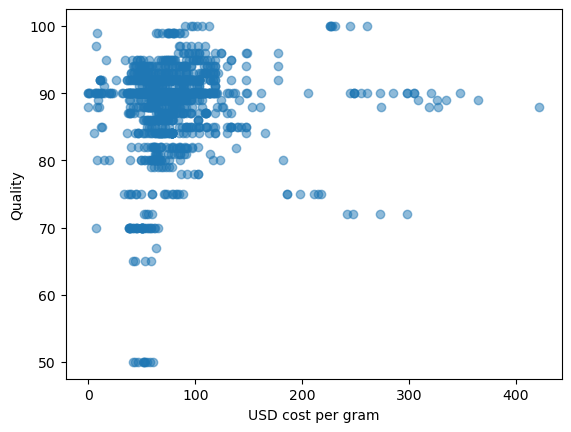

In [59]:
# visualize data
plt.scatter(dm_coke['usd_cost_per_gram'],dm_coke['quality'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Quality')

### Outliers for price and quality

In [60]:
# create new columns to indicate if it is an outlier for price or quality
dm_coke['outlierPrice'] = 0
dm_coke['outlierQuality'] = 0

# get mean and std
mean_price = dm_coke['usd_cost_per_gram'].mean()
std_price = dm_coke['usd_cost_per_gram'].std()
mean_qual = dm_coke['quality'].mean()
std_qual = dm_coke['quality'].std()

# iterate through the dataframe
for i,val in enumerate(dm_coke['usd_cost_per_gram']):
    if abs(val - mean_price) > 2 * std_price:
        dm_coke.loc[i,"outlierPrice"] = 1

for i,val in enumerate(dm_coke['quality']):
    if abs(val - mean_qual) > 2 * std_qual:
        dm_coke.loc[i,"outlierQuality"] = 1

In [67]:
# count ouliers and non outliers
from collections import Counter
print(Counter(dm_coke['outlierPrice']))
print(Counter(dm_coke['outlierQuality']))

# print means
print('Avg cost per gram:', mean_price)
print('Avg quality:', mean_qual)

Counter({0: 1457, 1: 47})
Counter({0: 1425, 1: 79})
Avg cost per gram: 78.14529658372498
Avg quality: 88.52646276595743


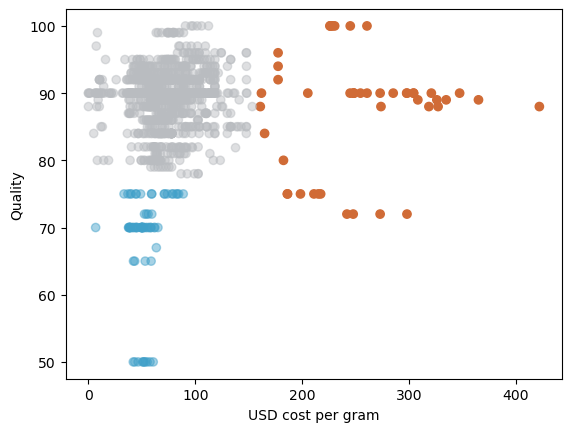

In [66]:
# code from lab feedback
# create an empty list for color
colorColumn = []

for i in range(len(dm_coke)):
    if dm_coke["outlierPrice"][i] == 1:
        colorColumn.append("#D06B36ff") # orange color
    elif dm_coke["outlierQuality"][i] == 1:
        colorColumn.append("#40A0C977") # a blue color
    else:
        colorColumn.append("#B9BCC077") # gray

plt.xlabel('USD cost per gram')
plt.ylabel('Quality')
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['quality'] , c = colorColumn)

### Outliers for rating and quality

Text(0, 0.5, 'Quality')

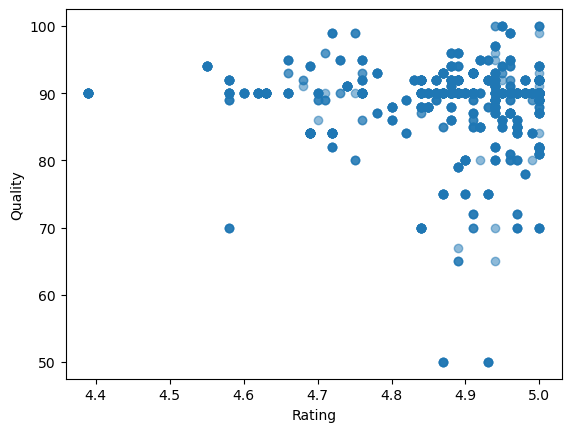

In [68]:
# visualize data
plt.scatter(dm_coke['rating'],dm_coke['quality'], alpha=0.5)
plt.xlabel('Rating')
plt.ylabel('Quality')

In [71]:
# create new columns to indicate if it is an outlier for price or quality
dm_coke['outlierRating'] = 0

# get mean and std
mean_rating = dm_coke['rating'].mean()
std_rating = dm_coke['rating'].std()

# iterate through the dataframe
for i,val in enumerate(dm_coke['rating']):
    if abs(val - mean_rating) > 2 * std_rating:
        dm_coke.loc[i,"outlierRating"] = 1

# count ouliers and non outliers
print(Counter(dm_coke['outlierRating']))


# print mean
print('Avg rating:', mean_rating)

Counter({0: 1405, 1: 99})
Avg rating: 4.884328457446809


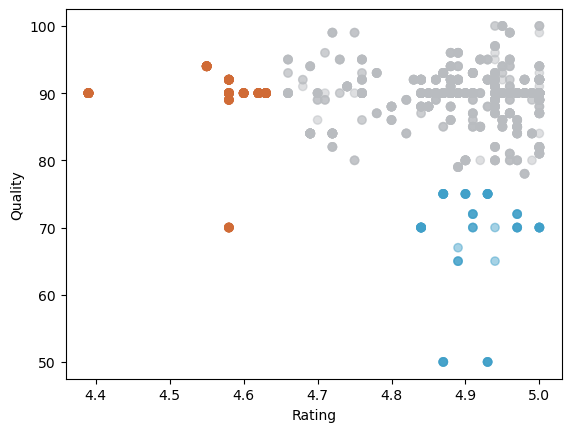

In [73]:
# code from lab feedback
# create an empty list for color
colorColumn = []

for i in range(len(dm_coke)):
    if dm_coke["outlierRating"][i] == 1:
        colorColumn.append("#D06B36ff") # orange color
    elif dm_coke["outlierQuality"][i] == 1:
        colorColumn.append("#40A0C977") # a blueish color
    else:
        colorColumn.append("#B9BCC077") # gray

plt.xlabel('Rating')
plt.ylabel('Quality')
plt.scatter(dm_coke['rating'], dm_coke['quality'] , c = colorColumn)

### Outliers for cost per gram and rating

Text(0, 0.5, 'Rating')

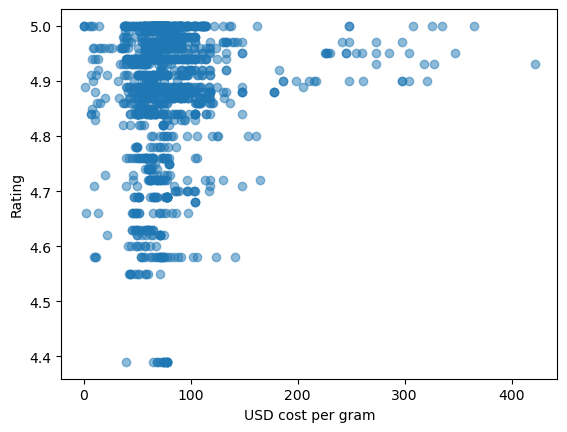

In [69]:
# visualize data
plt.scatter(dm_coke['usd_cost_per_gram'],dm_coke['rating'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Rating')

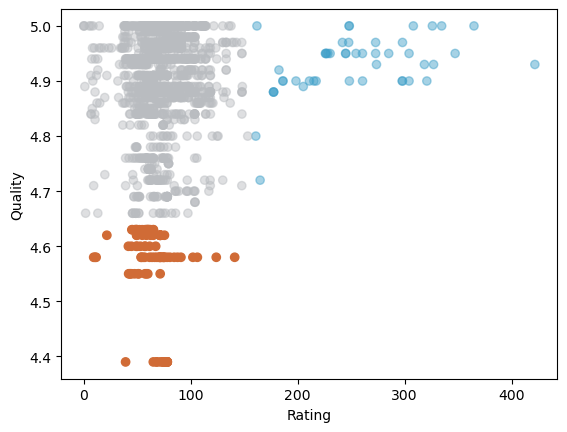

In [75]:
# code from lab feedback
# create an empty list for color
colorColumn = []


for i in range(len(dm_coke)):
    if dm_coke["outlierRating"][i] == 1:
        colorColumn.append("#D06B36ff") # orange color
    elif dm_coke["outlierPrice"][i] == 1:
        colorColumn.append("#40A0C977") # a blue color
    else:
        colorColumn.append("#B9BCC077") # gray

plt.xlabel('Rating')
plt.ylabel('Quality')
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['rating'] , c = colorColumn)

### Feature selection

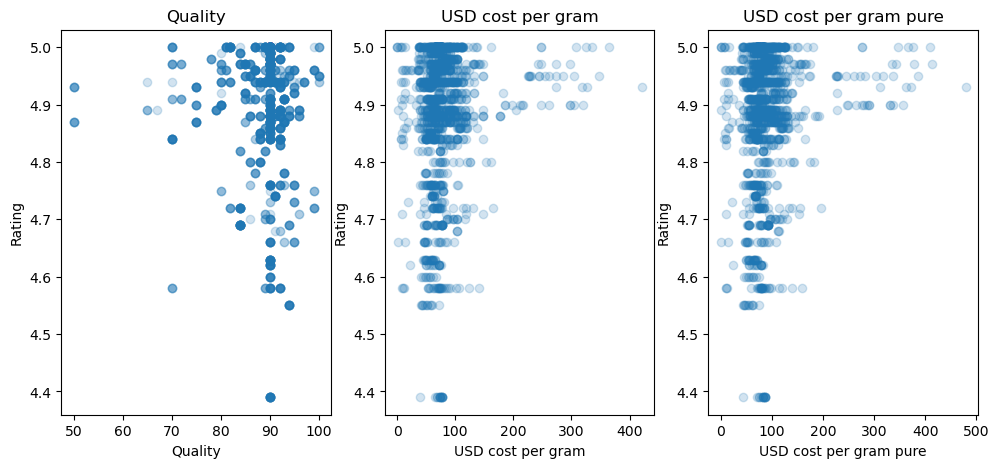

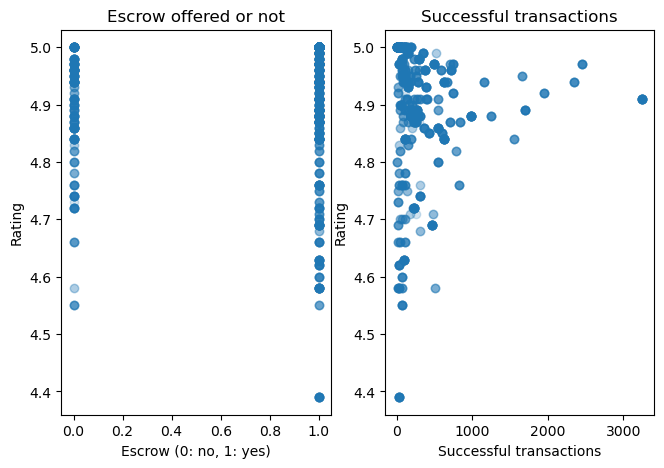

In [93]:
# dependent variable
y="rating";
# features
x01="quality"
x02="usd_cost_per_gram"
x03="usd_cost_per_gram_pure"
x04="escrow"
x05="successful_transactions"

fig = plt.figure(figsize=(16,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x01],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Quality')
scp.set_xlabel('Quality')
scp.set_ylabel('Rating')

scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x02],dm_coke.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram')
scp.set_xlabel('USD cost per gram')
scp.set_ylabel('Rating')

scp = fig.add_subplot(143)
scp.scatter(dm_coke.loc[:,x03],dm_coke.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram pure')
scp.set_xlabel('USD cost per gram pure')
scp.set_ylabel('Rating')



plt.show()

fig = plt.figure(figsize=(16,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x04],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Escrow offered or not')
scp.set_xlabel('Escrow (0: no, 1: yes)')
scp.set_ylabel('Rating')


scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x05],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Successful transactions')
scp.set_xlabel('Successful transactions')
scp.set_ylabel('Rating')


plt.show()



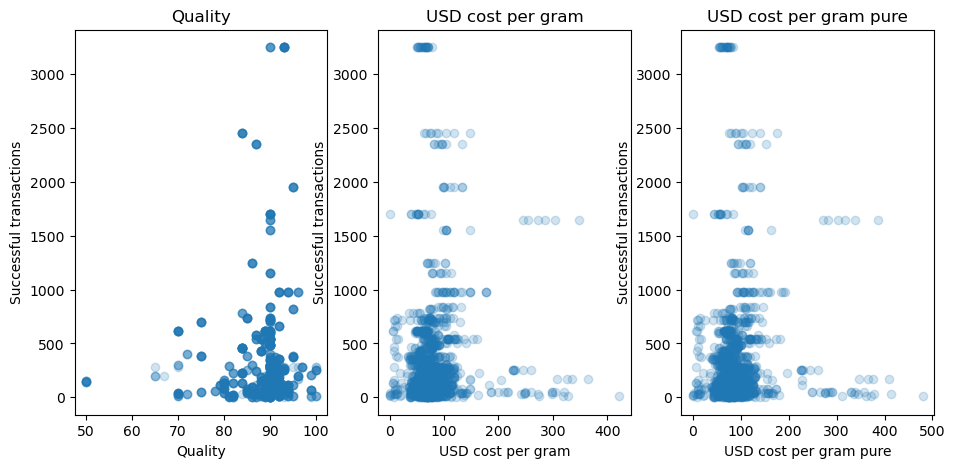

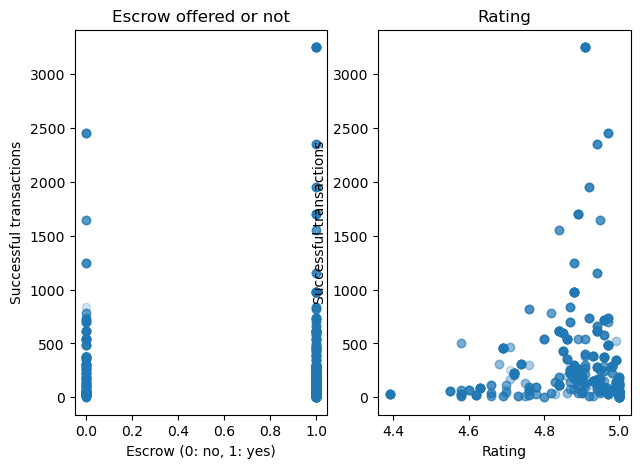

In [137]:
# dependent variable
y="successful_transactions";
# features
x01="quality"
x02="usd_cost_per_gram"
x03="usd_cost_per_gram_pure"
x04="escrow"
x05="rating"

fig = plt.figure(figsize=(15,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x01],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Quality')
scp.set_xlabel('Quality')
scp.set_ylabel('Successful transactions')

scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x02],dm_coke.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram')
scp.set_xlabel('USD cost per gram')
scp.set_ylabel('Successful transactions')

scp = fig.add_subplot(143)
scp.scatter(dm_coke.loc[:,x03],dm_coke.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram pure')
scp.set_xlabel('USD cost per gram pure')
scp.set_ylabel('Successful transactions')



plt.show()

fig = plt.figure(figsize=(15,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x04],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Escrow offered or not')
scp.set_xlabel('Escrow (0: no, 1: yes)')
scp.set_ylabel('Successful transactions')


scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x05],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Rating')
scp.set_xlabel('Rating')
scp.set_ylabel('Successful transactions')


plt.show()



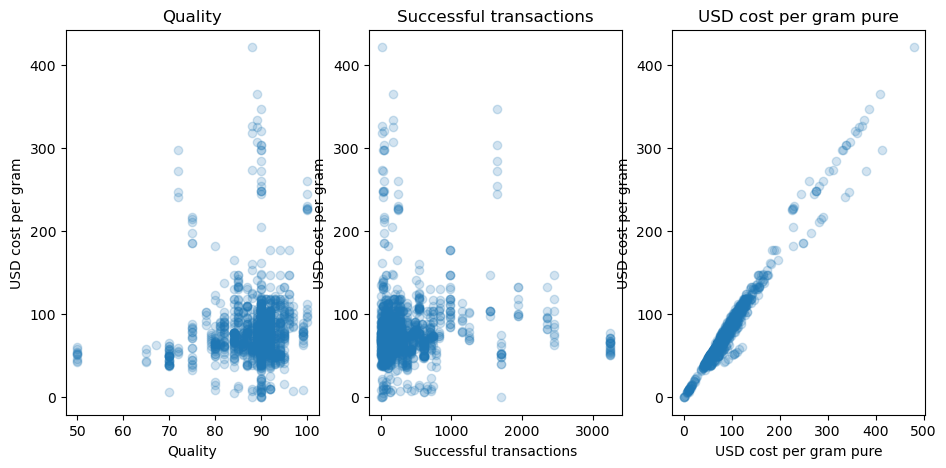

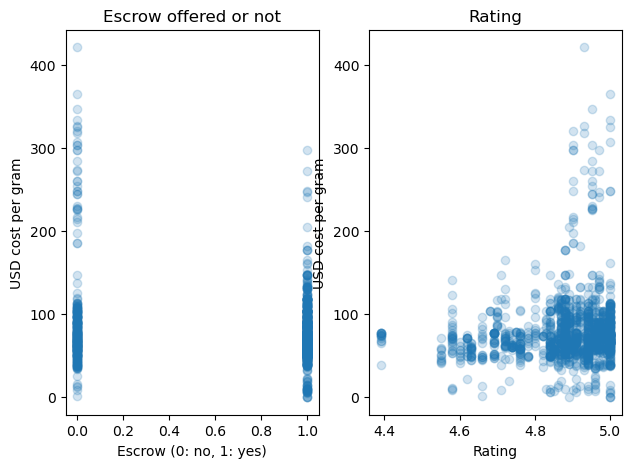

In [181]:
# dependent variable
y="usd_cost_per_gram";
# features
x01="quality"
x02="successful_transactions"
x03="usd_cost_per_gram_pure"
x04="escrow"
x05="rating"

fig = plt.figure(figsize=(15,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x01],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Quality')
scp.set_xlabel('Quality')
scp.set_ylabel('USD cost per gram')

scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x02],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Successful transactions')
scp.set_xlabel('Successful transactions')
scp.set_ylabel('USD cost per gram')

scp = fig.add_subplot(143)
scp.scatter(dm_coke.loc[:,x03],dm_coke.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram pure')
scp.set_xlabel('USD cost per gram pure')
scp.set_ylabel('USD cost per gram')



plt.show()

fig = plt.figure(figsize=(15,5))

scp = fig.add_subplot(141)
scp.scatter(dm_coke.loc[:,x04],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Escrow offered or not')
scp.set_xlabel('Escrow (0: no, 1: yes)')
scp.set_ylabel('USD cost per gram')


scp = fig.add_subplot(142)
scp.scatter(dm_coke.loc[:,x05],dm_coke.loc[:,y], alpha=.2)
scp.set_title('Rating')
scp.set_xlabel('Rating')
scp.set_ylabel('USD cost per gram')


plt.show()


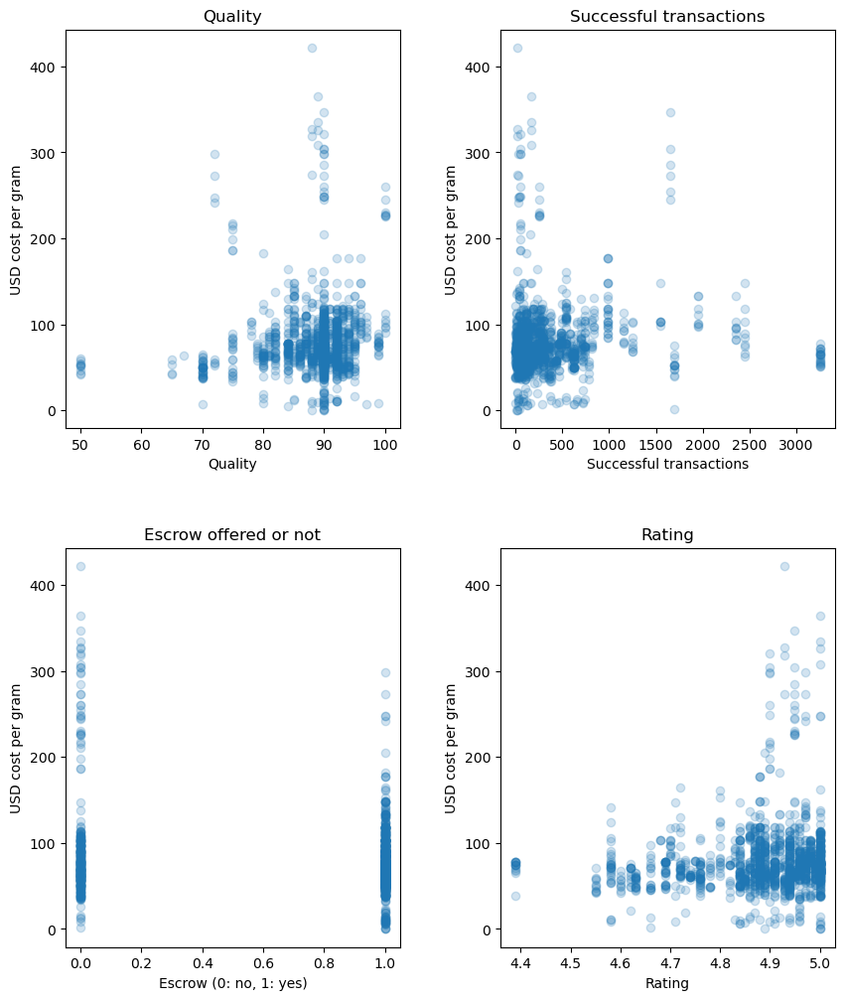

In [753]:
# dependent variable
y = "usd_cost_per_gram"
# features
x01 = "quality"
x02 = "successful_transactions"
x03 = "usd_cost_per_gram_pure"
x04 = "escrow"
x05 = "rating"

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 12))

axes[0, 0].scatter(dm_coke[x01], dm_coke[y], alpha=0.2)
axes[0, 0].set_title('Quality')
axes[0, 0].set_xlabel('Quality')
axes[0, 0].set_ylabel('USD cost per gram')

axes[0, 1].scatter(dm_coke[x02], dm_coke[y], alpha=0.2)
axes[0, 1].set_title('Successful transactions')
axes[0, 1].set_xlabel('Successful transactions')
axes[0, 1].set_ylabel('USD cost per gram')

# axes[0, 2].scatter(dm_coke[x03], dm_coke[y], alpha=0.2)
# axes[0, 2].set_title('USD cost per gram pure')
# axes[0, 2].set_xlabel('USD cost per gram pure')
# axes[0, 2].set_ylabel('USD cost per gram')

axes[1, 0].scatter(dm_coke[x04], dm_coke[y], alpha=0.2)
axes[1, 0].set_title('Escrow offered or not')
axes[1, 0].set_xlabel('Escrow (0: no, 1: yes)')
axes[1, 0].set_ylabel('USD cost per gram')

axes[1, 1].scatter(dm_coke[x05], dm_coke[y], alpha=0.2)
axes[1, 1].set_title('Rating')
axes[1, 1].set_xlabel('Rating')
axes[1, 1].set_ylabel('USD cost per gram')


# Adjust layout to add space between subplots
plt.subplots_adjust(wspace=0.3, hspace=0.3)

plt.show()







### Looking at correlations

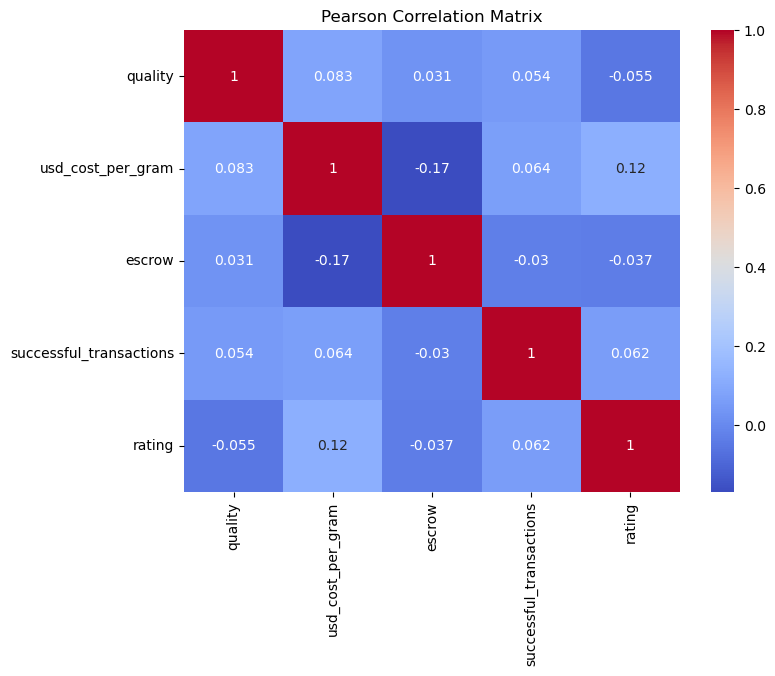

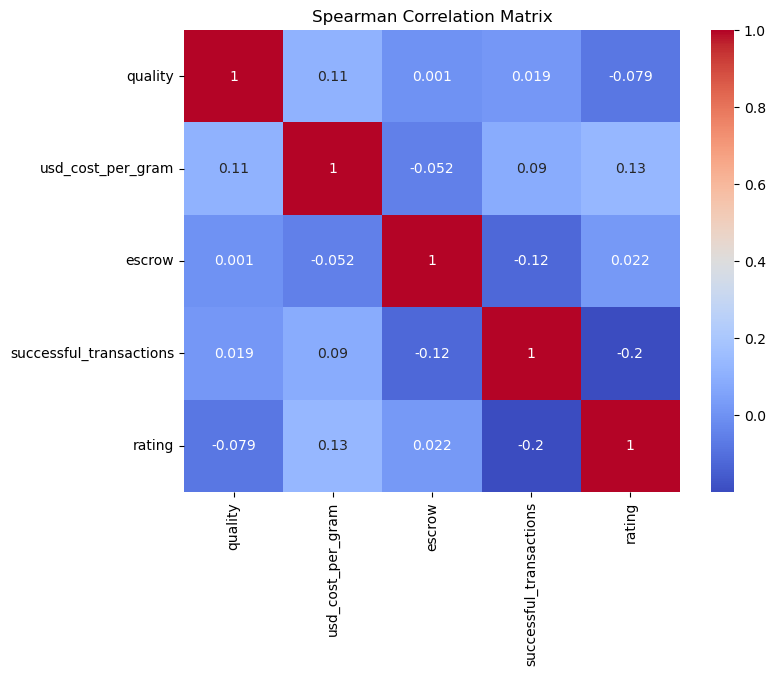

In [754]:
import seaborn as sns
selected_rows = ['quality','usd_cost_per_gram', 'escrow', 'successful_transactions',
                'rating',]

# correlation matrix
correlation_matrix = dm_coke[selected_rows].corr()

fig = plt.figure(figsize=(8,6))
heatmap = sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True)
plt.title('Pearson Correlation Matrix')
plt.show()

correlation_matrix = dm_coke[selected_rows].corr(method='spearman')

fig = plt.figure(figsize=(8, 6))
heatmap = sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True)

plt.title('Spearman Correlation Matrix')
plt.show()


In [117]:
def pearson(x, y):
    corrPearson, pValPearson = stats.pearsonr(x,y)
    print("Pearson's correlation is", corrPearson, "with a p-value of",pValPearson)

def spearman(x, y):
    corrSpearman, pValSpearman = stats.spearmanr(x,y)
    print ("Spearman's correlation is", corrSpearman, "with a p-value of",pValSpearman)

In [118]:
pearson(dm_coke['rating'], dm_coke['quality'])
spearman(dm_coke['rating'], dm_coke['quality'])

Pearson's correlation is -0.05519100938278303 with a p-value of 0.032335495526001345
Spearman's correlation is -0.07883737372129443 with a p-value of 0.0022159739476174094


In [121]:
pearson(dm_coke['rating'], dm_coke['usd_cost_per_gram'])
spearman(dm_coke['rating'], dm_coke['usd_cost_per_gram'])

Pearson's correlation is 0.1219770387358872 with a p-value of 2.0929385311955494e-06
Spearman's correlation is 0.13035319991858735 with a p-value of 3.921292689223122e-07


In [123]:
pearson(dm_coke['rating'], dm_coke['usd_cost_per_gram_pure'])
spearman(dm_coke['rating'], dm_coke['usd_cost_per_gram_pure'])

Pearson's correlation is 0.12691683919395214 with a p-value of 7.89661099725517e-07
Spearman's correlation is 0.12513535057850403 with a p-value of 1.12710592899504e-06


In [122]:
pearson(dm_coke['rating'], dm_coke['successful_transactions'])
spearman(dm_coke['rating'], dm_coke['successful_transactions'])

Pearson's correlation is 0.06243258907699112 with a p-value of 0.01545340822318702
Spearman's correlation is -0.19866435764218085 with a p-value of 7.502389884686667e-15


## Regression Modeling

### Linear Regression

In [759]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# set dependent variables to x and indepdent variable to y
y_col = 'usd_cost_per_gram'
X_cols = ['quality', 'rating', 'escrow', 'successful_transactions']

# get dependent variables and indepdent variables from the dataframe
X = dm_coke[X_cols]
y = dm_coke[y_col]

# split the data into training and testing 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a linear regression model
model = LinearRegression()

# train the model
model.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model.predict(X_test)

# evaluate and validate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)


Mean Squared Error: 1950.526804551289
R-squared: 0.0638070110391703
Coefficients: [ 4.55442426e-01  3.97415599e+01 -1.45715463e+01  3.49114745e-03]
Intercept: -146.6269052817159


In [760]:
dm_coke['pred_cost_per_gram'] = model.predict(X)


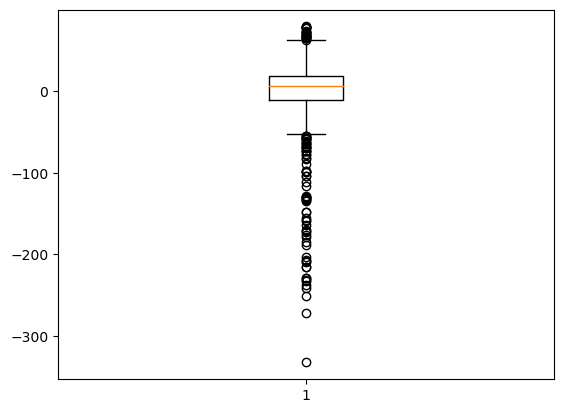

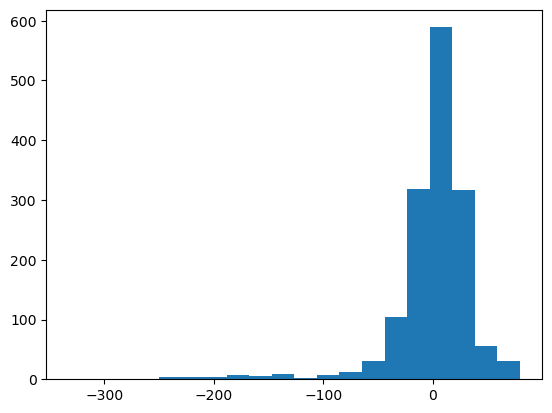

Mean -0.152572486485
Standard devation 39.350230841541
Mean price 78.145296583725
Median price 71.299586000000


In [761]:
# code from lab feedback
dm_coke['resid'] = dm_coke['pred_cost_per_gram']-dm_coke['usd_cost_per_gram']
plt.boxplot(dm_coke['resid'])
plt.show()
plt.hist(dm_coke['resid'],bins=20)
plt.show()
dm_coke['resid'].describe()
print("Mean {:.12f}".format(dm_coke['resid'].mean()))#More readable number
print("Standard devation {:.12f}".format(dm_coke['resid'].std()))#More readable number
print("Mean price {:.12f}".format(dm_coke['usd_cost_per_gram'].mean()))
print("Median price {:.12f}".format(dm_coke['usd_cost_per_gram'].median()))


In [762]:
dm_coke['pred_cost_per_gram'] = model.predict(X)



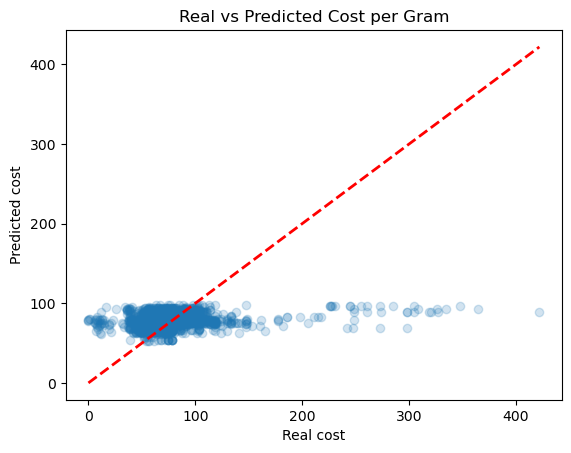

In [763]:
# visualize the real vs predicted values
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['pred_cost_per_gram'], alpha=0.2)
plt.plot([dm_coke[y_col].min(), dm_coke[y_col].max()], [dm_coke[y_col].min(), dm_coke[y_col].max()], linestyle='--', color='red', linewidth=2)

plt.xlabel('Real cost')
plt.ylabel('Predicted cost')
plt.title('Real vs Predicted Cost per Gram')

plt.show()



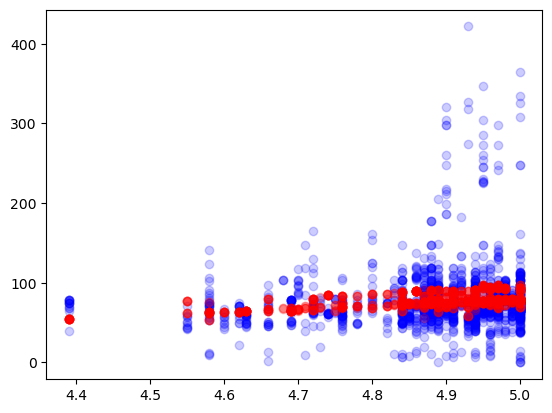

In [764]:
plt.scatter(dm_coke['rating'],dm_coke['usd_cost_per_gram'],c='blue', alpha=0.2)
plt.scatter(dm_coke['rating'], dm_coke['pred_cost_per_gram'],c='red', alpha=0.2)

### Check linear regression modeling without outliers to see if there is an improvement

In [765]:

dm_coke_copy = dm_coke.copy()
# Identify rows with outliers
outlier_rows = dm_coke_copy["outlierPrice"] == 1

# Filter DataFrame to keep only non-outliers
dm_coke_copy = dm_coke_copy[~outlier_rows]

In [766]:
# set dependent variables to x and indepdent variable to y
y_col = 'usd_cost_per_gram'
X_cols = ['quality', 'rating', 'escrow', 'successful_transactions']

# get dependent variables and indepdent variables from the dataframe
X = dm_coke_copy[X_cols]
y = dm_coke_copy[y_col]

# split the data into training and testing 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a linear regression model
model = LinearRegression()

# train the model
model.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model.predict(X_test)

# evaluate and validate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)


Mean Squared Error: 512.4898292566372
R-squared: 0.024004327518215463
Coefficients: [6.62488548e-01 2.41702582e+01 2.82379396e-01 5.07914667e-03]
Intercept: -105.88659417488475


In [767]:
dm_coke_copy.drop('pred_cost_per_gram', axis=1, inplace=True)

dm_coke_copy['pred_cost_per_gram'] = model.predict(X)


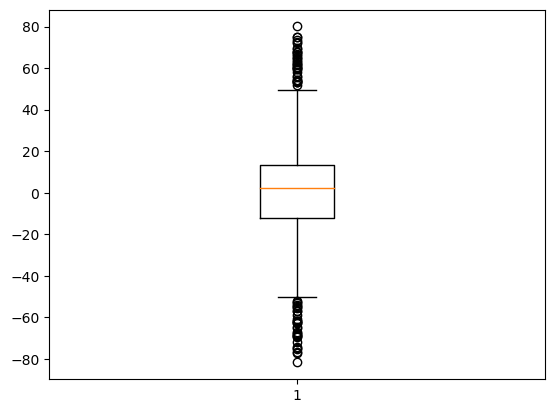

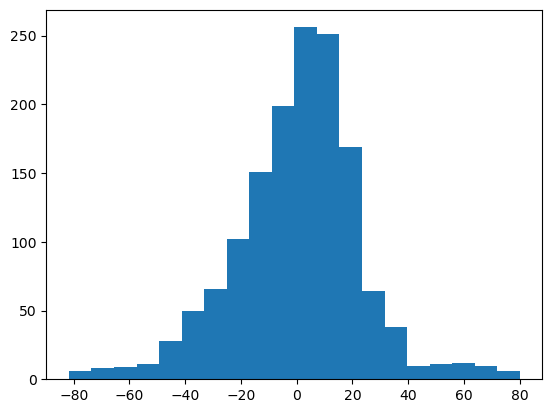

Mean 0.261815538827
Standard devation 22.795269579222
Mean price 72.477074822528
Median price 70.669731000000


In [768]:
dm_coke_copy.drop('resid', axis=1, inplace=True)

# code from lab feedback
dm_coke_copy['resid'] = dm_coke_copy['pred_cost_per_gram']-dm_coke_copy['usd_cost_per_gram']
plt.boxplot(dm_coke_copy['resid'])
plt.show()
plt.hist(dm_coke_copy['resid'],bins=20)
plt.show()
dm_coke_copy['resid'].describe()
print("Mean {:.12f}".format(dm_coke_copy['resid'].mean()))#More readable number
print("Standard devation {:.12f}".format(dm_coke_copy['resid'].std()))#More readable number
print("Mean price {:.12f}".format(dm_coke_copy['usd_cost_per_gram'].mean()))
print("Median price {:.12f}".format(dm_coke_copy['usd_cost_per_gram'].median()))

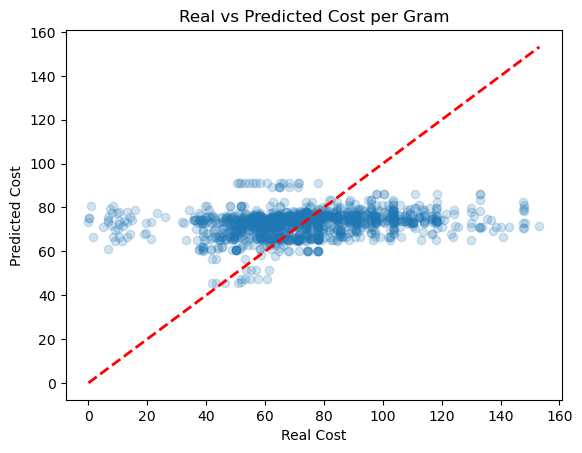

In [769]:
# visualize real vs predicted values
plt.scatter(dm_coke_copy['usd_cost_per_gram'], dm_coke_copy['pred_cost_per_gram'], alpha=0.2)
plt.plot([dm_coke_copy[y_col].min(), dm_coke_copy[y_col].max()], [dm_coke_copy[y_col].min(), dm_coke_copy[y_col].max()], linestyle='--', color='red', linewidth=2)

plt.xlabel('Real Cost')
plt.ylabel('Predicted Cost')
plt.title('Real vs Predicted Cost per Gram')


plt.show()



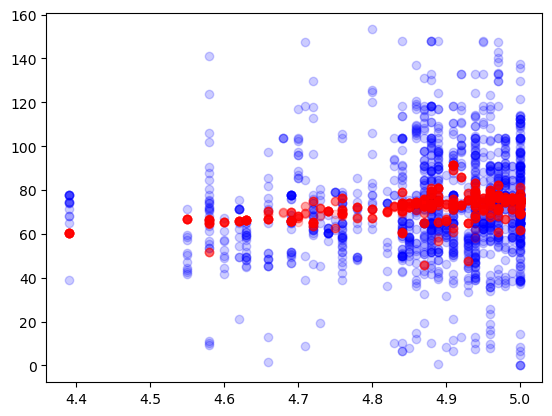

In [770]:
plt.scatter(dm_coke_copy['rating'],dm_coke_copy['usd_cost_per_gram'],c='blue', alpha=0.2)
plt.scatter(dm_coke_copy['rating'], dm_coke_copy['pred_cost_per_gram'],c='red', alpha=0.2)

### Polynomial Regression

In [800]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


# set dependent variables to x and indepdent variable to y
y_col = 'usd_cost_per_gram'
X_cols = ['quality', 'rating', 'escrow', 'successful_transactions']

# get dependent variables and indepdent variables from the dataframe
X = dm_coke[X_cols]
y = dm_coke[y_col]

# split the data into training and testing 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# polynomial features
degree = 4  
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.transform(X_test)

# create a polynomial regression model
poly_model = LinearRegression()

# train the model
poly_model.fit(X_train_poly, y_train)

# make predictions on testing data
y_pred_poly = poly_model.predict(X_test_poly)

# evaluate and validate the model
mse_poly = mean_squared_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)

print(f'Mean Squared Error (Polynomial): {mse_poly}')
print(f'R-squared (Polynomial): {r2_poly}')


Mean Squared Error (Polynomial): 1442.9393358114708
R-squared (Polynomial): 0.3074334141266736


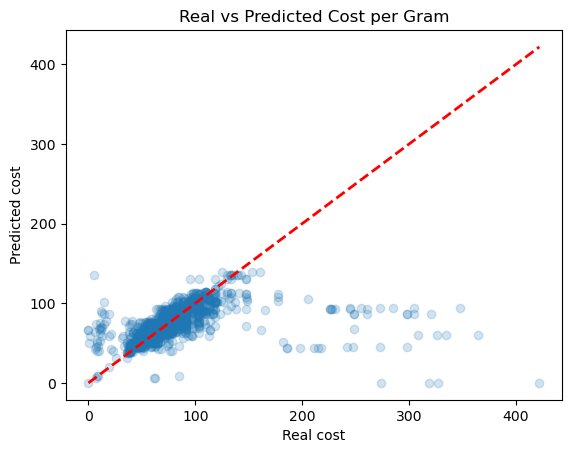

In [786]:
# visualize the real vs predicted values
dm_coke['pred_cost_per_gram'] = model.predict(X)
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['pred_cost_per_gram'], alpha=0.2)
plt.plot([dm_coke[y_col].min(), dm_coke[y_col].max()], [dm_coke[y_col].min(), dm_coke[y_col].max()], linestyle='--', color='red', linewidth=2)

plt.xlabel('Real cost')
plt.ylabel('Predicted cost')
plt.title('Real vs Predicted Cost per Gram')

plt.show()

### Decision Tree

In [779]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score

# set dependent variables to x and indepdent variable to y
y_col = 'usd_cost_per_gram'
X_cols = ['quality', 'rating', 'escrow', 'successful_transactions']

# get dependent variables and indepdent variables from the dataframe
X = dm_coke[X_cols]
y = dm_coke[y_col]

# split the data into training and testing 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a decision tree model
model = DecisionTreeRegressor(random_state=42)

# train the model 
model.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model.predict(X_test)

# evaluate and validate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Mean Squared Error: 380.2638283868943
R-squared: 0.8174850357039256


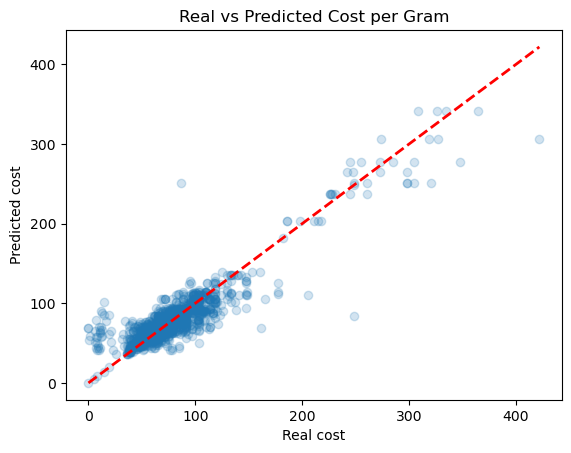

In [775]:
# visualize real vs predicted costs
dm_coke['pred_cost_per_gram'] = model.predict(X)
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['pred_cost_per_gram'], alpha=0.2)
plt.plot([dm_coke[y_col].min(), dm_coke[y_col].max()], [dm_coke[y_col].min(), dm_coke[y_col].max()], linestyle='--', color='red', linewidth=2)

plt.xlabel('Real cost')
plt.ylabel('Predicted cost')
plt.title('Real vs Predicted Cost per Gram')

plt.show()

In [776]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# set dependent variables to x and indepdent variable to y
y_col = 'usd_cost_per_gram'
X_cols = ['quality', 'rating', 'escrow', 'successful_transactions']

# get dependent variables and indepdent variables from the dataframe
X = dm_coke[X_cols]
y = dm_coke[y_col]

# split the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a random forest model
model = RandomForestRegressor(random_state=42)

# train the model 
model.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model.predict(X_test)

# evaluate and validate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')


Mean Squared Error: 382.717053359294
R-squared: 0.8163075630262134


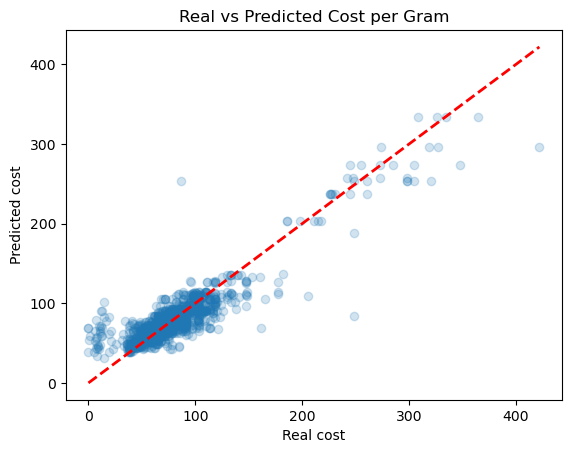

In [777]:
# visualize the real vs predicted costs
dm_coke['pred_cost_per_gram'] = model.predict(X)
plt.scatter(dm_coke['usd_cost_per_gram'], dm_coke['pred_cost_per_gram'], alpha=0.2)
plt.plot([dm_coke[y_col].min(), dm_coke[y_col].max()], [dm_coke[y_col].min(), dm_coke[y_col].max()], linestyle='--', color='red', linewidth=2)

plt.xlabel('Real cost')
plt.ylabel('Predicted cost')
plt.title('Real vs Predicted Cost per Gram')

plt.show()

## Data clustering by country in Dream Market

In [106]:
# check unique countries
unique_origin = dm_coke['ships_from'].unique()
unique_origin

array(['NL', 'FR', 'GB', 'DE', 'US', 'AU', 'ES', 'BE', 'EU', 'WW', 'IT',
       'CA', 'BR', 'CZ', 'SE', 'CH', 'CN'], dtype=object)

In [107]:
# get count of listings from each unique country
count_nl_origin = sum(dm_coke['ships_from_NL'])
print('NL:', count_nl_origin)

count_fr_origin = sum(dm_coke['ships_from_FR'])
print('FR:', count_fr_origin)

count_gb_origin = sum(dm_coke['ships_from_GB'])
print('GB:', count_gb_origin)

count_de_origin = sum(dm_coke['ships_from_DE'])
print('DE:', count_de_origin)

count_us_origin = sum(dm_coke['ships_from_US'])
print('US:', count_us_origin)

count_au_origin = sum(dm_coke['ships_from_AU'])
print('AU:', count_au_origin)

count_es_origin = sum(dm_coke['ships_from_ES'])
print('ES:', count_es_origin)

count_be_origin = sum(dm_coke['ships_from_BE'])
print('BE:', count_be_origin)

count_eu_origin = sum(dm_coke['ships_from_EU'])
print('EU:', count_eu_origin)

count_ww_origin = sum(dm_coke['ships_from_WW'])
print('WW:', count_ww_origin)

count_it_origin = sum(dm_coke['ships_from_IT'])
print('IT:', count_it_origin)

count_ca_origin = sum(dm_coke['ships_from_CA'])
print('CA:', count_ca_origin)

count_br_origin = sum(dm_coke['ships_from_BR'])
print('BR:', count_br_origin)

count_cz_origin = sum(dm_coke['ships_from_CZ'])
print('CZ:', count_cz_origin)

count_se_origin = sum(dm_coke['ships_from_SE'])
print('SE:', count_se_origin)

count_ch_origin = sum(dm_coke['ships_from_CH'])
print('CH:', count_ch_origin)

count_cn_origin = sum(dm_coke['ships_from_CN'])
print('CN:', count_cn_origin)



NL: 496
FR: 70
GB: 251
DE: 376
US: 112
AU: 40
ES: 11
BE: 25
EU: 72
WW: 16
IT: 7
CA: 19
BR: 5
CZ: 1
SE: 1
CH: 1
CN: 1


In [111]:
# function to get the percentage
def get_percentage(country):
    return (country / 1504) * 100

nl_pct = get_percentage(count_nl_origin)
fr_pct = get_percentage(count_fr_origin)
gb_pct = get_percentage(count_gb_origin)
de_pct = get_percentage(count_de_origin)
us_pct = get_percentage(count_us_origin)
au_pct = get_percentage(count_au_origin)
es_pct = get_percentage(count_es_origin)
be_pct = get_percentage(count_be_origin)
eu_pct = get_percentage(count_eu_origin)
ww_pct = get_percentage(count_ww_origin)
it_pct = get_percentage(count_it_origin)
ca_pct = get_percentage(count_ca_origin)
br_pct = get_percentage(count_br_origin)
cz_pct = get_percentage(count_cz_origin)
se_pct = get_percentage(count_se_origin)
ch_pct = get_percentage(count_ch_origin)
cn_pct = get_percentage(count_cn_origin)

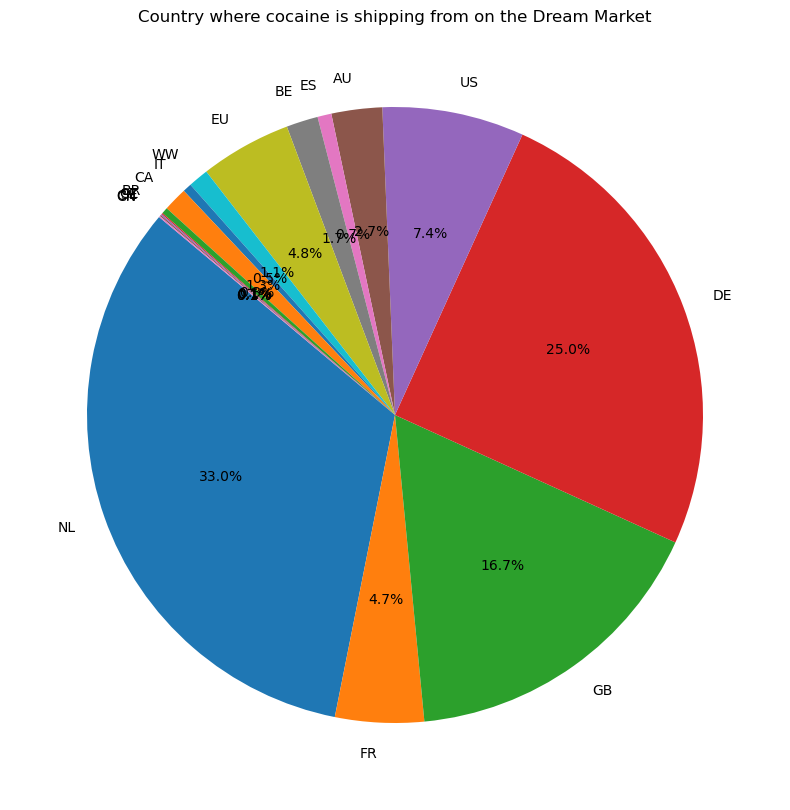

In [114]:
# data to put in pie chart
labels = ['NL', 'FR', 'GB', 'DE', 'US', 'AU', 'ES', 'BE', 'EU', 'WW', 'IT', 'CA', 'BR', 'CZ', 'SE', 'CH', 'CN']
sizes = [nl_pct, fr_pct, gb_pct, de_pct, us_pct, au_pct, es_pct, be_pct, eu_pct, ww_pct, it_pct, ca_pct, br_pct, cz_pct,
        se_pct, ch_pct, cn_pct]  

# plot the pie chart
plt.figure(figsize=(10, 10))
plt.title('Country where cocaine is shipping from on the Dream Market')
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)

# display the pie chart
plt.show()


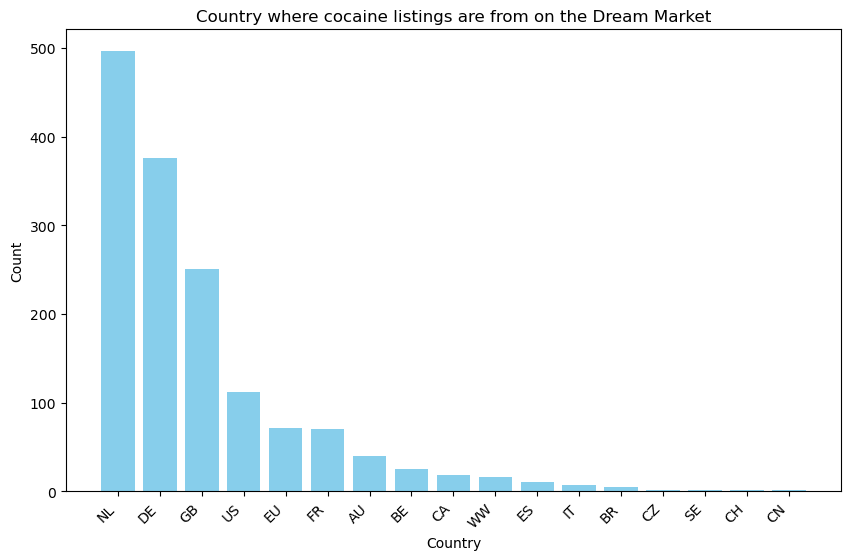

In [170]:
import matplotlib.pyplot as plt

# data for the bar graph
labels = ['NL', 'FR', 'GB', 'DE', 'US', 'AU', 'ES', 'BE', 'EU', 'WW', 'IT', 'CA', 'BR', 'CZ', 'SE', 'CH', 'CN']
sizes = [count_nl_origin, count_fr_origin, count_gb_origin, count_de_origin, count_us_origin, count_au_origin,
         count_es_origin, count_be_origin, count_eu_origin, count_ww_origin, count_it_origin, count_ca_origin, 
         count_br_origin, count_cz_origin,count_se_origin, count_ch_origin, count_cn_origin]

# sort by sizes in descending order
data_sorted = sorted(zip(labels, sizes), key=lambda x: x[1], reverse=True)

labels_sorted, sizes_sorted = zip(*data_sorted)

# plot the bar graph
plt.figure(figsize=(10, 6))
plt.bar(labels_sorted, sizes_sorted, color='skyblue')
plt.title('Country where cocaine listings are from on the Dream Market')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

plt.show()



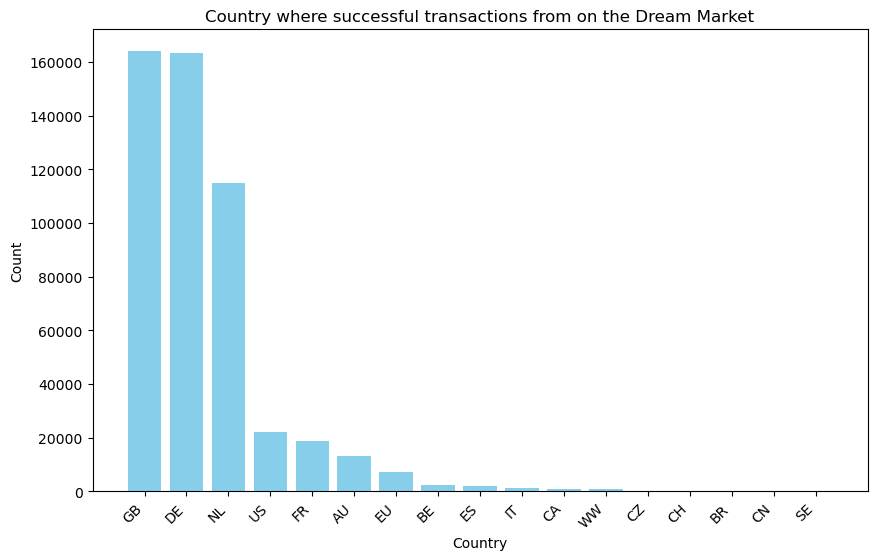

In [171]:
# data for the bar graph
labels = ['NL', 'FR', 'GB', 'DE', 'US', 'AU', 'ES', 'BE', 'EU', 'WW', 'IT', 'CA', 'BR', 'CZ', 'SE', 'CH', 'CN']
sizes = [nl_df['successful_transactions'].sum(), fr_df['successful_transactions'].sum(), 
         gb_df['successful_transactions'].sum(), de_df['successful_transactions'].sum(), 
         us_df['successful_transactions'].sum(), au_df['successful_transactions'].sum(),
         es_df['successful_transactions'].sum(), be_df['successful_transactions'].sum(), 
         eu_df['successful_transactions'].sum(), ww_df['successful_transactions'].sum(), 
         it_df['successful_transactions'].sum(), ca_df['successful_transactions'].sum(), 
         br_df['successful_transactions'].sum(), cz_df['successful_transactions'].sum(),
         se_df['successful_transactions'].sum(), ch_df['successful_transactions'].sum(), 
         cn_df['successful_transactions'].sum()]

# sort by sizes in descending order
data_sorted = sorted(zip(labels, sizes), key=lambda x: x[1], reverse=True)

labels_sorted, sizes_sorted = zip(*data_sorted)

# plot the bar graph
plt.figure(figsize=(10, 6))
plt.bar(labels_sorted, sizes_sorted, color='skyblue')
plt.title('Country where successful transactions from on the Dream Market')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right') 

plt.show()


In [125]:
# define condition where ships from is NL
condition = dm_coke['ships_from'] == 'NL'

# filter rows based on the condition
nl_df = dm_coke[condition].copy()

# reset the index of the nl_df
nl_df = nl_df.reset_index(drop=True)

In [146]:
# function to cluster rows in a new df by country of origin
def new_df(country):
    condition = dm_coke['ships_from'] == country

    # filter rows based on the condition
    new_df = dm_coke[condition].copy()

    # reset the index of the nl_df
    new_df = new_df.reset_index(drop=True)
    
    return new_df


de_df = new_df('DE')
gb_df = new_df('GB')
us_df = new_df('US')
eu_df = new_df('EU')
fr_df = new_df('FR')
au_df = new_df('AU')
be_df = new_df('BE')
ca_df = new_df('CA')
ww_df = new_df('WW')
es_df = new_df('ES')
it_df = new_df('IT')
br_df = new_df('BR')
cz_df = new_df('CZ')
se_df = new_df('SE')
ch_df = new_df('CH')
cn_df = new_df('CN')

In [595]:
# get stats for netherlands
nl_qual_mean = nl_df['quality'].mean()
total_trans_nl = nl_df['successful_transactions'].sum()
nl_avg_cost = nl_df['usd_cost_per_gram'].mean()
nl_med_cost = nl_df['usd_cost_per_gram'].median()
nl_mode_cost = nl_df['usd_cost_per_gram'].mode()
nl_avg_cost_pure = nl_df['usd_cost_per_gram_pure'].mean()
nl_avg_rating = nl_df['rating'].mean()
nl_escrow = nl_df['escrow'].sum()
total_rows = len(nl_df)
print('transactions',total_trans_nl)
print('avg quality', nl_qual_mean)
print('avg cost per gram', nl_avg_cost)
print('median cost per gram', nl_med_cost)
print('mode cost per gram', nl_mode_cost)
print('avg cost per gram pure', nl_avg_cost_pure)
print('avg rating', nl_avg_rating)
print('escrow offered', nl_escrow, 'out of', total_rows)

transactions 114814
avg quality 87.77016129032258
avg cost per gram 62.80492932038913
median cost per gram 63.5493701808784
mode cost per gram 0    77.850078
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 71.6627866461183
avg rating 4.861149193548387
escrow offered 391 out of 496


In [596]:
# function to get stats from each country
def get_stats(df):
    qual_mean = df['quality'].mean()
    total_trans = df['successful_transactions'].sum()
    avg_cost = df['usd_cost_per_gram'].mean()
    med_cost = df['usd_cost_per_gram'].median()
    mode_cost = df['usd_cost_per_gram'].mode()
    avg_cost_pure = df['usd_cost_per_gram_pure'].mean()
    avg_rating = df['rating'].mean()
    escrow = df['escrow'].sum()
    total_rows = len(df)
    print('transactions',total_trans)
    print('avg quality', qual_mean)
    print('avg cost per gram', avg_cost)
    print('median cost per gram', med_cost)
    print('mode cost per gram', mode_cost)
    print('avg cost per gram pure', avg_cost_pure)
    print('avg rating', avg_rating)
    print('escrow offered', escrow, 'out of', total_rows)

In [600]:
# denmark stats
get_stats(de_df)

transactions 163534
avg quality 89.56648936170212
avg cost per gram 71.96344104939871
median cost per gram 71.40756113565881
mode cost per gram 0    77.850078
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 80.45795227763102
avg rating 4.870159574468085
escrow offered 307 out of 376


In [601]:
# great britain stats
get_stats(gb_df)

transactions 163974
avg quality 87.31474103585657
avg cost per gram 90.38672856884932
median cost per gram 88.68358400000001
mode cost per gram 0    103.522968
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 103.3614961883023
avg rating 4.891195219123505
escrow offered 214 out of 251


In [602]:
# usa stats
get_stats(us_df)

transactions 22240
avg quality 89.96428571428571
avg cost per gram 81.77195745900217
median cost per gram 84.01065976130491
mode cost per gram 0     91.203004
1     97.717504
2    113.877784
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 91.18765808827116
avg rating 4.908392857142857
escrow offered 74 out of 112


In [603]:
# europe stats
get_stats(eu_df)

transactions 7194
avg quality 86.88888888888889
avg cost per gram 56.84050298310435
median cost per gram 58.4127527
mode cost per gram 0    58.42535
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 65.62274981308161
avg rating 4.9369444444444435
escrow offered 59 out of 72


In [604]:
# france stats
get_stats(fr_df)

transactions 18591
avg quality 89.48285714285713
avg cost per gram 90.08103771950205
median cost per gram 91.4189542839147
mode cost per gram 0     90.875479
1    103.800104
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 100.83634560612387
avg rating 4.9068571428571435
escrow offered 31 out of 70


In [605]:
# australia stats
get_stats(au_df)

transactions 13248
avg quality 87.4
avg cost per gram 265.2805293148256
median cost per gram 257.484724
mode cost per gram 0    272.817194
1    297.939411
2    304.093994
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 305.56066596837024
avg rating 4.941249999999999
escrow offered 5 out of 40


In [606]:
# belgium stats
get_stats(be_df)

transactions 2388
avg quality 89.56
avg cost per gram 79.7099378379483
median cost per gram 77.850078
mode cost per gram 0    68.402253
1    77.850078
2    96.090679
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 88.88071602898546
avg rating 4.9807999999999995
escrow offered 8 out of 25


In [607]:
# canada stats
get_stats(ca_df)

transactions 995
avg quality 92.6842105263158
avg cost per gram 74.84890574553923
median cost per gram 75.5826
mode cost per gram 0    79.793631
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 81.40821944560683
avg rating 4.967368421052631
escrow offered 13 out of 19


In [608]:
# spain stats
get_stats(es_df)

transactions 2090
avg quality 89.72727272727273
avg cost per gram 73.05735588656097
median cost per gram 74.1429314321706
mode cost per gram 0       9.085029
1      38.950233
2      64.900259
3      64.925453
4      71.299586
5      74.142931
6      77.900466
7      84.400570
8      97.375583
9     103.800104
10    116.850700
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 81.3251472515792
avg rating 4.79818181818182
escrow offered 6 out of 11


In [609]:
# italy stats
get_stats(it_df)

transactions 1122
avg quality 90.0
avg cost per gram 91.76327502024735
median cost per gram 90.8754794
mode cost per gram 0     71.299586
1     77.900466
2     90.867081
3     90.875479
4     97.249612
5    103.800104
6    110.350596
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 101.95919446734139
avg rating 4.935714285714285
escrow offered 2 out of 7


In [610]:
# brazil stats
get_stats(br_df)

transactions 5
avg quality 87.0
avg cost per gram 38.52697064
median cost per gram 38.421155
mode cost per gram 0    37.287416
1    38.295184
2    38.421155
3    38.748680
4    39.882419
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 44.28387429821348
avg rating 5.0
escrow offered 5 out of 5


In [611]:
# czech stats
get_stats(cz_df)

transactions 70
avg quality 92.0
avg cost per gram 84.148628
median cost per gram 84.148628
mode cost per gram 0    84.148628
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 91.4659000098586
avg rating 4.95
escrow offered 1 out of 1


In [612]:
# switzerland stats
get_stats(ch_df)

transactions 7
avg quality 90.0
avg cost per gram 135.54479600000002
median cost per gram 135.54479600000002
mode cost per gram 0    135.544796
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 150.6053288944876
avg rating 5.0
escrow offered 1 out of 1


In [613]:
# china stats
get_stats(cn_df)

transactions 2
avg quality 99.0
avg cost per gram 8.440057000000001
median cost per gram 8.440057000000001
mode cost per gram 0    8.440057
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 8.52531010141728
avg rating 5.0
escrow offered 1 out of 1


In [614]:
# sweden stats
get_stats(se_df)

transactions 1
avg quality 93.0
avg cost per gram 121.4108498
median cost per gram 121.4108498
mode cost per gram 0    121.41085
Name: usd_cost_per_gram, dtype: float64
avg cost per gram pure 130.549300857506
avg rating 5.0
escrow offered 1 out of 1


In [732]:
# number of rows/listings for the top countries
print('NL rows', len(nl_df))
print('DE rows', len(de_df))
print('GB rows', len(gb_df))
print('US rows', len(us_df))

NL rows 496
DE rows 376
GB rows 251
US rows 112


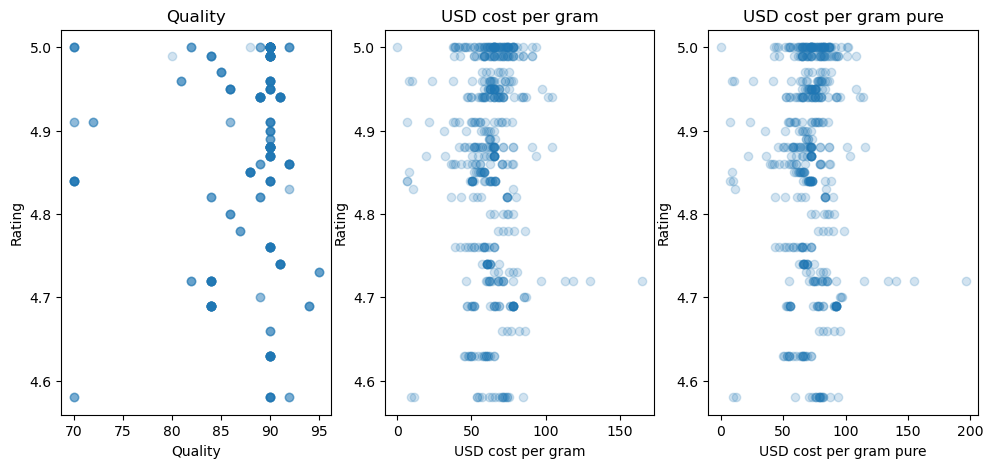

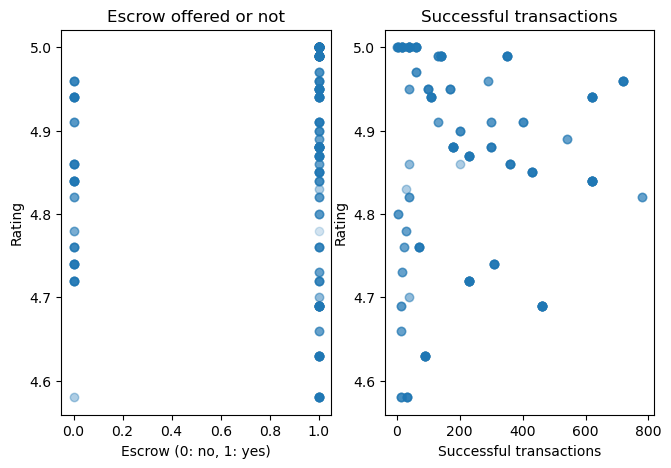

In [165]:
# visualize data for netherlands dataframe

# dependent variable
y="rating";
# features
x01="quality"
x02="usd_cost_per_gram"
x03="usd_cost_per_gram_pure"
x04="escrow"
x05="successful_transactions"

fig = plt.figure(figsize=(16,5))

scp = fig.add_subplot(141)
scp.scatter(nl_df.loc[:,x01],nl_df.loc[:,y], alpha=.2)
scp.set_title('Quality')
scp.set_xlabel('Quality')
scp.set_ylabel('Rating')

scp = fig.add_subplot(142)
scp.scatter(nl_df.loc[:,x02],nl_df.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram')
scp.set_xlabel('USD cost per gram')
scp.set_ylabel('Rating')

scp = fig.add_subplot(143)
scp.scatter(nl_df.loc[:,x03],nl_df.loc[:,y], alpha=.2)
scp.set_title('USD cost per gram pure')
scp.set_xlabel('USD cost per gram pure')
scp.set_ylabel('Rating')



plt.show()

fig = plt.figure(figsize=(16,5))

scp = fig.add_subplot(141)
scp.scatter(nl_df.loc[:,x04],nl_df.loc[:,y], alpha=.2)
scp.set_title('Escrow offered or not')
scp.set_xlabel('Escrow (0: no, 1: yes)')
scp.set_ylabel('Rating')


scp = fig.add_subplot(142)
scp.scatter(nl_df.loc[:,x05],nl_df.loc[:,y], alpha=.2)
scp.set_title('Successful transactions')
scp.set_xlabel('Successful transactions')
scp.set_ylabel('Rating')


plt.show()



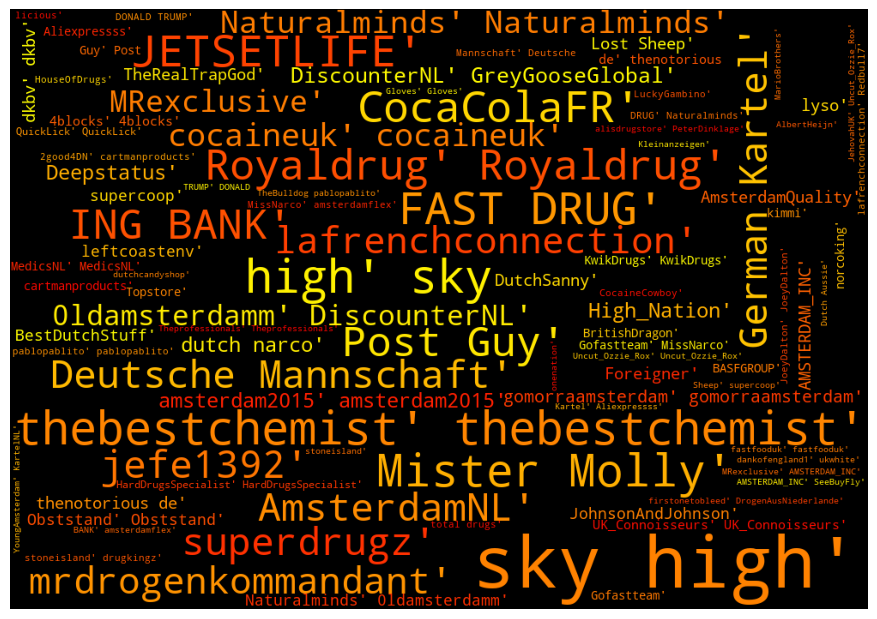

In [211]:
# look at which vendors are most frequent in dream market

dm_vendors = dm_coke['vendor_name'].astype(str).tolist()
wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(dm_vendors)) 
# plot wordcloud                        
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

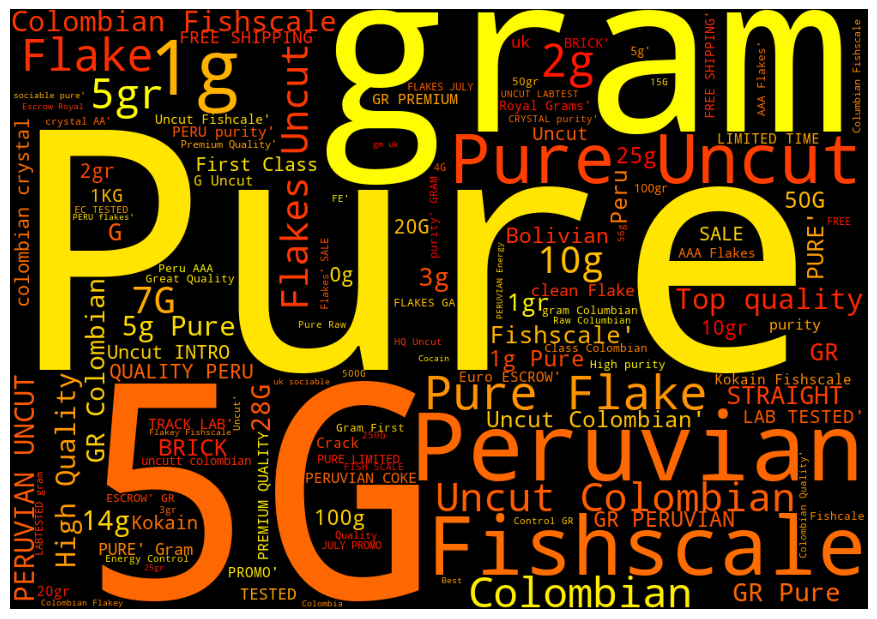

In [216]:
# look at what words are most used to describe cocaine listings on dream market

dm_product_titles = dm_coke['product_title'].astype(str).tolist()
dm_product_titles = [title.replace('cocaine', '') for title in dm_product_titles]
dm_product_titles = [title.replace('Cocaine', '') for title in dm_product_titles]
dm_product_titles = [title.replace('COCAINE', '') for title in dm_product_titles]

wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(dm_product_titles)) 
# plot wordcloud                        
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

# Agora

## Data prepration and derivation

In [182]:
# check and examine dataset
agora

,Vendor,Category,Item,Item Description,Price,Origin,Destination,Rating,Remarks
0,CheapPayTV,Services/Hacking,12 Month HuluPlus gift Code,12-Month HuluPlus Codes for $25. They are wort...,0.05027025666666667 BTC,Torland,NaN,4.96/5,NaN
1,CheapPayTV,Services/Hacking,Pay TV Sky UK Sky Germany HD TV and much mor...,Hi we offer a World Wide CCcam Service for En...,0.152419585 BTC,Torland,NaN,4.96/5,NaN
2,KryptykOG,Services/Hacking,OFFICIAL Account Creator Extreme 4.2,Tagged Submission Fix Bebo Submission Fix Adju...,0.007000000000000005 BTC,Torland,NaN,4.93/5,NaN
3,cyberzen,Services/Hacking,VPN > TOR > SOCK TUTORIAL,How to setup a VPN > TOR > SOCK super safe enc...,0.019016783532494728 BTC,NaN,NaN,4.89/5,NaN
4,businessdude,Services/Hacking,Facebook hacking guide,. This guide will teach you how to hack Faceb...,0.062018073963963936 BTC,Torland,NaN,4.88/5,NaN
...,...,...,...,...,...,...,...,...,...
109684,gonz324,Drugs/Opioids/Opium,1 gr purified Opium,This Listing is for a gramm of redefined Opium...,0.14363729 BTC,Germany,NaN,4.91/5,NaN
109685,cheqdropz,Weapons/Fireworks,Shipping Ticket,in order for me to ship one of the guns you bo...,0.08680555 BTC,USA,NaN,[0 deals],NaN
109686,SnowQueen,Drugs/Opioids/Opium,0.50 GRAMS #4 White Afghani Heroin - FULL ESCROW,0.50 grams #4 White Afghani Heroin SnowQueen...,0.33641201 BTC,Canada,Worldwide,[0 deals],NaN
109687,SnowQueen,Drugs/Opioids/Opium,1.0 GRAMS #4 White Afghani Heroin - FULL ESCROW,1.0 grams #4 White Afghani Heroin SnowQueen ...,0.61165820 BTC,Canada,Worldwide,[0 deals],NaN


In [183]:
# check for missing values
missingvals = agora.isnull().sum()
missingvals

Vendor                   0
 Category                0
 Item                    2
 Item Description       27
 Price                   5
 Origin               9882
 Destination         49161
 Rating                 15
 Remarks             97073
dtype: int64

In [184]:
# get size
rows = len(agora)
rows

109689

## Text analysis on Agora's listings

In [190]:
# check what item categories there are
unique_categories = agora[' Category'].unique()
unique_categories

array(['Services/Hacking', 'Services/Other', 'Drugs/RCs',
       'Forgeries/Physical documents', 'Tobacco/Smoked', 'Services/Money',
       'Counterfeits/Money', 'Data/Software', 'Data/Accounts',
       'Counterfeits/Clothing', 'Information/eBooks', 'Electronics',
       'Drug paraphernalia/Pipes', 'Drugs/Weight loss', 'Data/Pirated',
       'Drugs/Steroids', 'Drugs/Prescription', 'Information/Guides',
       'Forgeries/Scans/Photos', 'Other', 'Jewelry', 'Drugs/Other',
       'Counterfeits/Accessories', 'Counterfeits/Watches',
       'Drugs/Cannabis/Weed', 'Drugs/Benzos',
       'the Body Bags  shotty  and Mac make-up To: Kind Hearts and Gentle People',
       'Drugs/Cannabis/Shake/trim', 'Drugs/Cannabis/Synthetics',
       'Drugs/Cannabis/Concentrates', 'Drugs/Cannabis/Seeds',
       'Drugs/Cannabis/Hash', 'Drugs/Dissociatives/MXE',
       'Drugs/Dissociatives/Ketamine', 'Drugs/Cannabis/Edibles',
       'Drugs/Ecstasy/Pills', 'Drugs/Ecstasy/Other',
       'Drugs/Stimulants/Meth', 'Dru

In [488]:
# put all values of category in a list to use for wordcloud
strings_categories = agora[' Category'].astype(str).tolist()


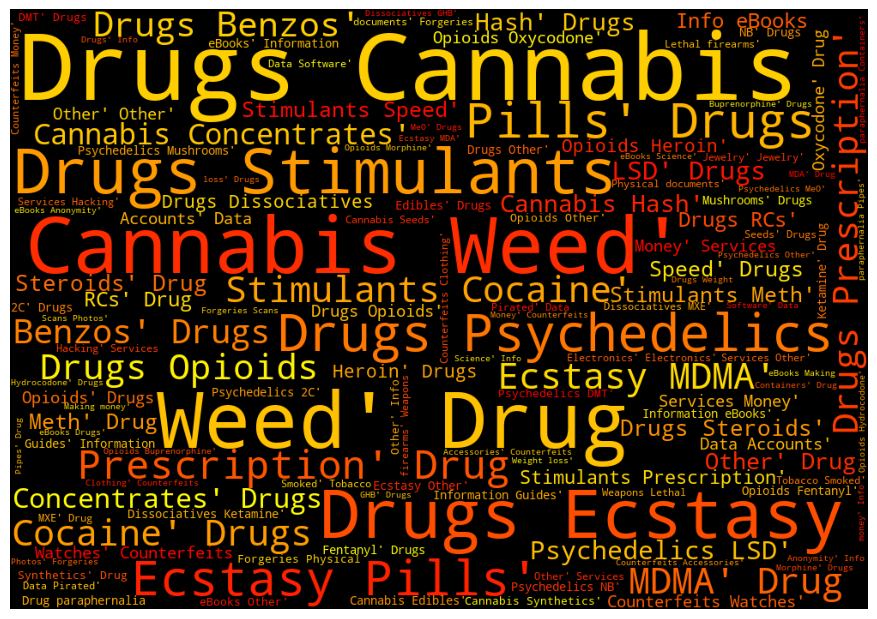

In [489]:
wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(strings_categories)) 
# plot wordcloud                       
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()


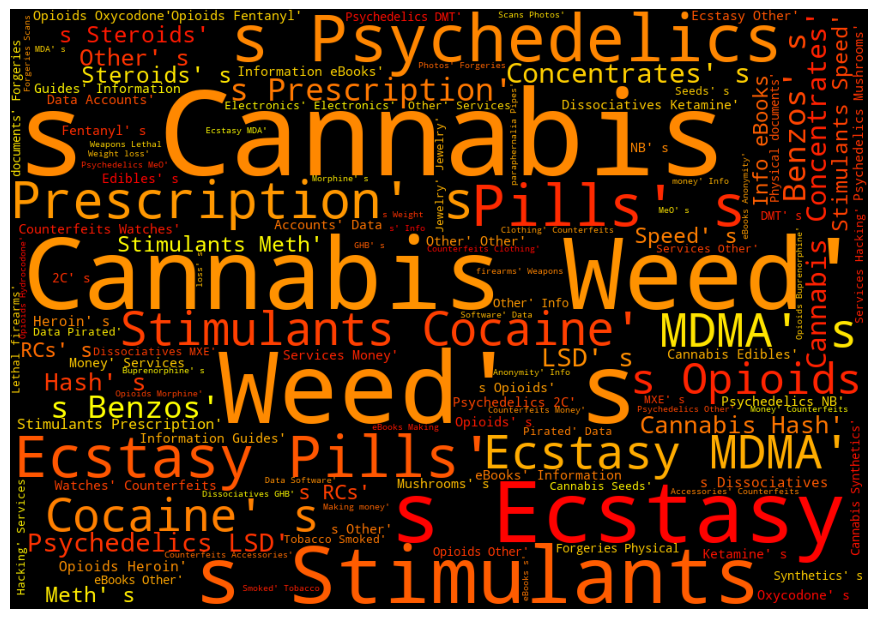

In [490]:

strings_categories = [title.replace('Drug', '') for title in strings_categories]

# unique words
unique_words = set()

# only add unique words
for title in strings_categories:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(strings_categories)) 
# plot wordcloud                        
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

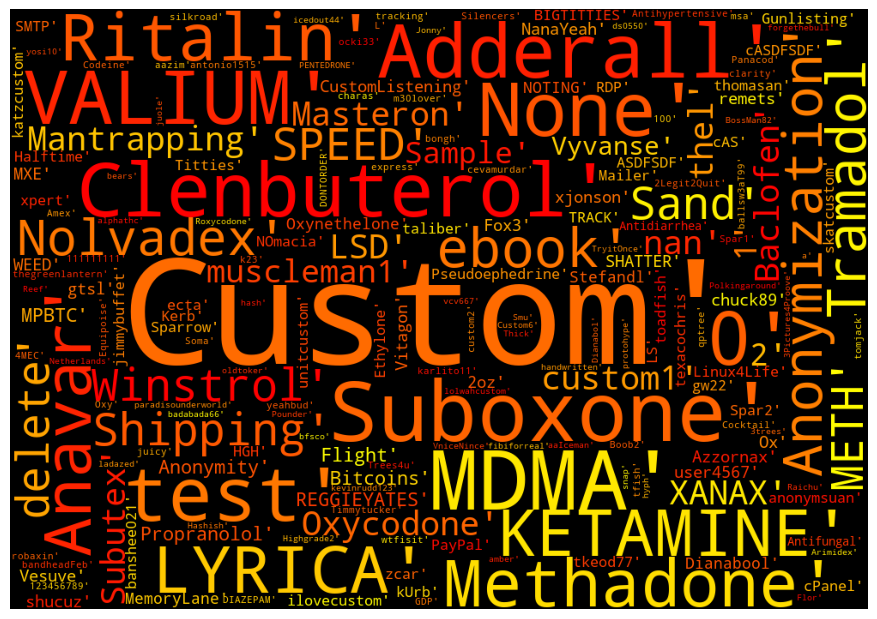

In [355]:
strings_items = agora[' Item'].astype(str).tolist()
strings_items_filtered = [x for x in strings_items if x.isalnum()]

wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(strings_items_filtered)) 
# plot the wordcloud                       
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

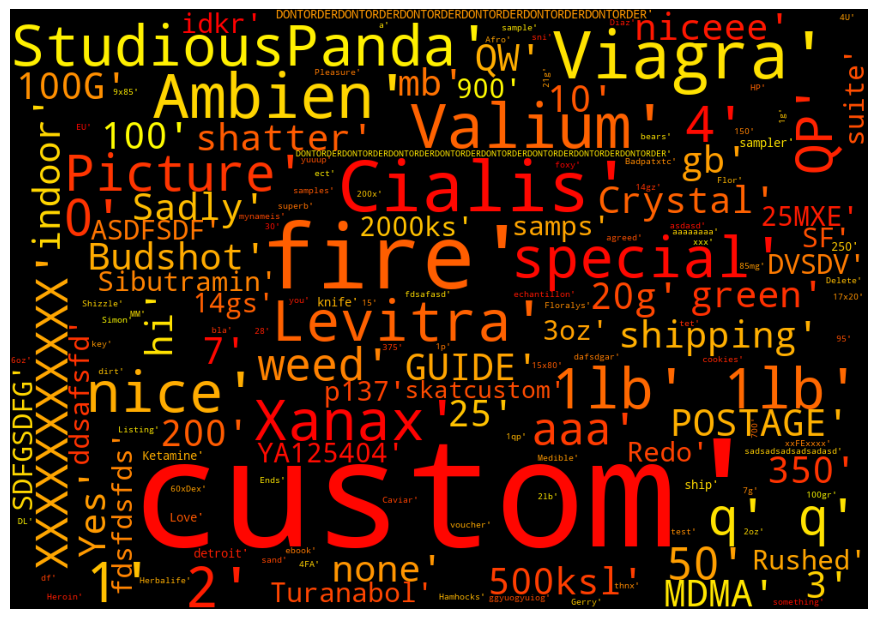

In [354]:
strings_descriptions = agora[' Item Description'].astype(str).tolist()
strings_descriptions = [title.replace('nan', '') for title in strings_descriptions]

strings_descriptions_filtered = [x for x in strings_descriptions if x.isalnum()]

wordcloud = WordCloud(width = 1000, height = 700, 
                background_color ='black', colormap=plt.cm.autumn,
                min_font_size = 10).generate(str(strings_descriptions_filtered)) 
# plot the WordCloud image                        
plt.figure(figsize = (11, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

In [669]:
agora_unique_origins = agora[' Origin'].unique()
agora_unique_origins

array(['Torland', nan, 'World', 'Internet', 'Australia', 'USA', 'EU',
       'France', 'UK', 'Canada', 'Netherlands', 'Swaziland', 'China',
       'China New Zealand  Russia  Finland  Germany or the Middle East.',
       'EU GER and AUS', 'Canada USA  UK  EU', 'USA Canada  W. Europe',
       'EU NZ & Russia', 'Germany', 'Poland', 'USA Canda  W. Europe',
       'Ukraine', 'Switzerland', 'TheUnitedSnakes', 'Italy', 'mypm',
       'Japan', 'HongKong', 'UK USA  Canada', 'UK usa  europe ',
       'UK Worldwide', 'Sweden', 'Denmark', 'Thailand', 'India', 'Me',
       'Latvia', 'Europe', 'UKUSA EU', 'Denmark norway and swizz',
       'UK usa  europe', 'Europe UK and others', 'ChinaorEU',
       'USA Canada', 'UK EU', 'UK USA Philippines', 'Worldwide',
       'Pakistan', 'undeclared', 'Uk USA&', 'UK USA&',
       'Germany Europe  Schweiz', 'Austria', 'CzechRepublic', 'WORLDWIDE',
       'UK europe  us', 'Belgium', 'Singapore', 'UK europe  usa',
       'Argentina', 'Canada US  UK  EU', 'Panama'

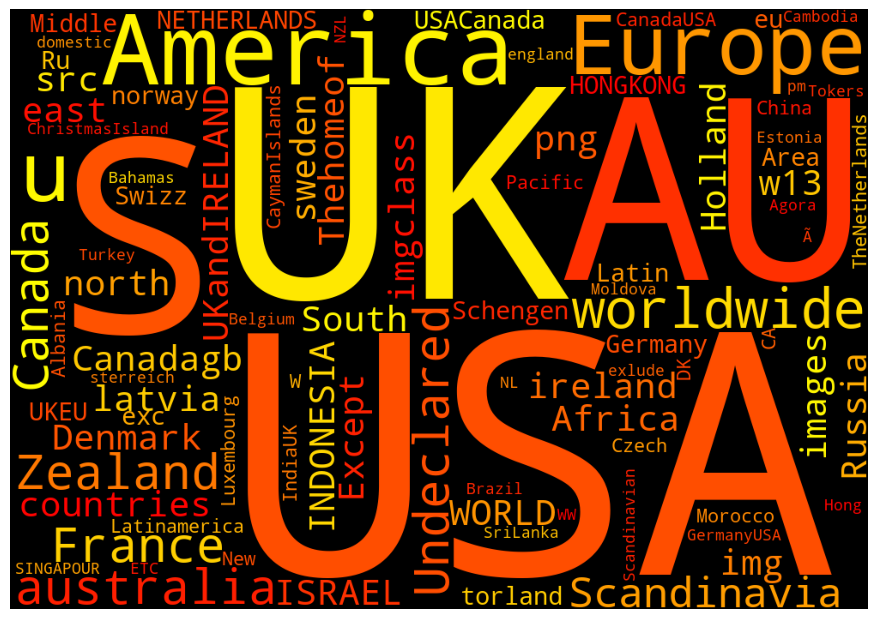

In [671]:
strings_origins = agora[' Origin'].astype(str).tolist()
# Remove 'nan' from strings_origins
strings_origins = [title.replace('nan', '') for title in strings_origins]
strings_origins = [title.replace('flag', '') for title in strings_origins]

# unique words
unique_words = set()

# only add unique words
for title in strings_origins:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

# plot wordcloud                        
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

## Exploring only cocaine listings on Agora

In [286]:
# create new dataframe with only coaine listings

# define condition 
condition = agora[' Category'] == 'Drugs/Stimulants/Cocaine'

# filter rows based on the condition
agora_coke = agora[condition].copy()

# reset the index of the nl_df
agora_coke = agora_coke.reset_index(drop=True)

agora_coke.drop(' Category', axis=1, inplace=True)



In [287]:
agora_coke

,Vendor,Item,Item Description,Price,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.8694170821804508 BTC,Belgium,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008228796666666666 BTC,USA,Worldwide,3.8/5,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.13836026454545453 BTC,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0/5,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.1450674281818182 BTC,USA,USA,~5/5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111486749166667 BTC,Netherlands,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.21304643 BTC,USA,NaN,[0 deals],NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.07323471 BTC,USA,NaN,[0 deals],NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.09986551 BTC,UK,NaN,~5/5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.49932757 BTC,USA,NaN,[0 deals],NaN


In [682]:
missing_vals = agora_coke.isnull().sum()
missing_vals

Vendor                  0
 Item                   0
 Item Description       2
 Price                  0
usd_price               0
usd_cost_per_gram     459
 Origin               203
 Destination         2282
 Rating                 0
 Remarks             4883
outlierPrice            0
outlierRating           0
dtype: int64

In [288]:
# getting usd cost

agora_coke[' Price'] = agora_coke[' Price'].apply(lambda x: pd.to_numeric(''.join(filter(lambda c: c.isdigit() or c == '.', str(x))), errors='coerce'))

# convert the column to float type
agora_coke[' Price'] = agora_coke[' Price'].astype(float)

agora_coke


,Vendor,Item,Item Description,Price,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.869417,Belgium,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008229,USA,Worldwide,3.8/5,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.138360,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0/5,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.145067,USA,USA,~5/5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111487,Netherlands,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.213046,USA,NaN,[0 deals],NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.073235,USA,NaN,[0 deals],NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.099866,UK,NaN,~5/5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.499328,USA,NaN,[0 deals],NaN


In [289]:
new_list1 = []
for i, value in enumerate(agora_coke[' Price']):
        usd = value * 374
        new_list1.append(usd)

agora_coke.insert(4, 'usd_price', new_list1)


In [290]:
agora_coke

,Vendor,Item,Item Description,Price,usd_price,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.869417,1073.161989,Belgium,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008229,3.077570,USA,Worldwide,3.8/5,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.138360,51.746739,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0/5,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.145067,54.255218,USA,USA,~5/5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111487,1537.696044,Netherlands,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.213046,79.679365,USA,NaN,[0 deals],NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.073235,27.389782,USA,NaN,[0 deals],NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.099866,37.349701,UK,NaN,~5/5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.499328,186.748511,USA,NaN,[0 deals],NaN


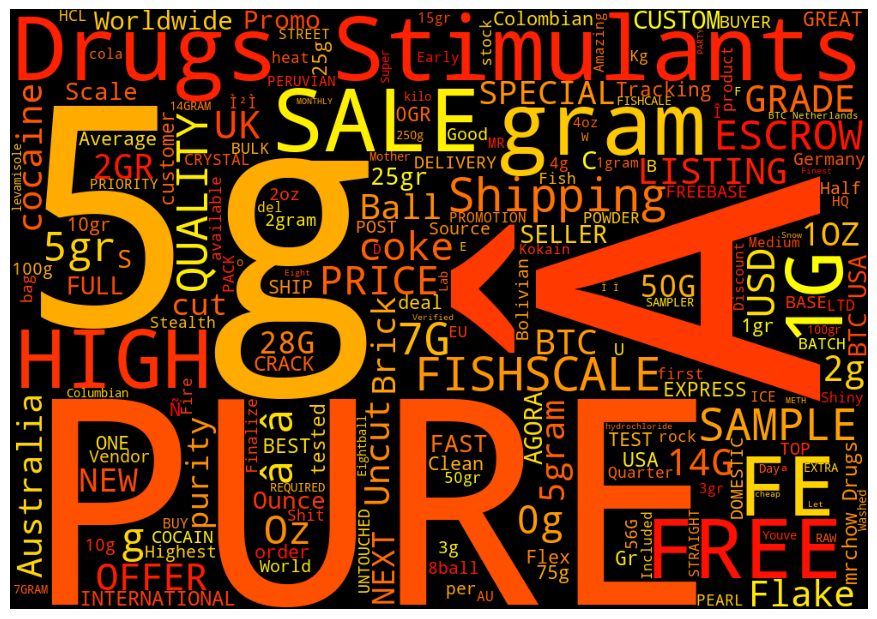

In [790]:
# use wordcloud to see what words are most used in cocaine listings on Agora

strings_items = agora_coke[' Item'].astype(str).tolist()
# Remove 'nan' from strings_origins
strings_items= [title.replace('nan', '') for title in strings_items]
strings_items= [title.replace('Cocaine', '') for title in strings_items]
strings_items= [title.replace('COCAINE', '') for title in strings_items]

# unique
unique_words = set()

# only add unique words
for title in strings_items:
    unique_words.update(title.split())


text_data = ' '.join(unique_words)


wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

# plot wordcloud                       
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

### Derive USD cost per gram

In [291]:
# extract numeric values from item name

numeric_vals = []

for x in agora_coke[' Item']:
    x_str = str(x)
    
    numeric_val = pd.to_numeric(''.join(filter(lambda char: char.isdigit() or char == '.', x_str)), errors='coerce')
    
    if not pd.isna(numeric_val):
        numeric_vals.append(numeric_val)
    else:
        numeric_vals.append(None)

print(numeric_vals)


[10.0, None, 5, 5, 25.8489, 2155, None, 0.55, 3.5, 0.25, None, 1, None, 1, 2, 7, 190, 5, 3.59, 1, 10, 10, 1, 5, 28, 31, 1, 1, None, 281375, 580, 2580, 5, 1, 1.9, 25.9, 1, None, 50110120, 0.59, 5.9, 5, 10.8489, 184.6, 0.5, 5.8489, 5, 903, 580, 74501, None, 1, 0.5, 5.0, 1, 2, 3.5, 2.5, 180, None, 2890, 1, None, None, 3.5657, 1, 845, 5, 130, 1, 2.5, 0.1, None, 14045, 25, 108590, 3.5, 5, 3.5, 1, 1, 148090, 1284, 190, 74107, 0.5, 1, 1, 1, 10, 25.8489, 14, 1, 3.5, 10, 580, 2, None, 5, 7500, 871, 2895, 1, 1, 1, 2, 3, 1.8489, 1.7145, 2, None, 50.8489, 1, 1, 2, 50.8489, 1.7145, 12, 1.1, 2, None, 1490, 0.25, 1, 1, 100, 0.25, 1, 0.5, 5, 90.0, 5, 2, 4.5, 14, 1, None, 790, 28, 5, 0.5, 5, 0.25, 3.5, 1, 25, 1, 4, 5, 0.1, 1, 2.58, 10.9, 580, 0.5, 9005, 20, 20, 189, 3.5, 5, 1.0, None, 5.0, 289, 280, 20, 1080, 1, None, 180, None, 901, 284.6, 2.8489, 2, 180, 18385, 1, 589, 7.0, 3.5, 2, 20, 10, 195, 840.5, 3.5809, 25, 293.5, 1288, 1.0, 841, 7, 0.25, 1.084, 3.53, 373.5, None, 18585, 1225, 20, None, 130, No

In [292]:
print(len(numeric_vals))

6007


In [293]:
# divde total cost by the numeric values extracted
for i, value in enumerate(numeric_vals):
    if value == 0:
        numeric_vals[i] = None

usd_cost_per_gram = []

for i, value in enumerate(agora_coke['usd_price']):
    if numeric_vals[i] is not None:
        usd_per_g = value / numeric_vals[i]
        usd_cost_per_gram.append(usd_per_g)
    else:
        usd_cost_per_gram.append(None)

print(usd_cost_per_gram)

[107.31619887354887, None, 10.349347787999996, 10.851043628000001, 59.48787159950069, 0.05739654280626451, None, 72.81231287441858, 55.88272296357143, 135.57429089599984, None, 107.754083228, None, 11.661020052000001, 1030.88742564359, 133.22891178768376, 0.23311435255263138, 96.13788148640002, 36.83520835734182, 80.82601889999997, 78.56985257800002, 64.6444270363784, 62.8557701042857, 79.69133227146669, 51.84170088232144, 5.9480811751225815, 2588.507514057143, 61.83782385, None, 0.004037449898946642, 0.6866006686859163, 0.05727395866445184, 150.30445901159183, 57.046278344, 56.518684543079935, 105.83734252687314, 68.26329756399996, None, 3.662237372965336e-06, 78.95034272435322, 84.36930473495603, 74.71044050443246, 57.0217777882243, 0.5259289097508126, 63.384752551999995, 60.17568059692137, 62.861233522999996, 0.4078197058693244, 0.46772759588834156, 0.005000546165569335, None, 84.77137108, 61.67477418666662, 63.62312780999999, 54.273801633333306, 62.241354266666654, 60.2968917571428

In [294]:
print(len(usd_cost_per_gram))

6007


In [295]:
# insert new column with usd cost per gram
agora_coke.insert(5, 'usd_cost_per_gram', usd_cost_per_gram)


In [296]:
agora_coke

,Vendor,Item,Item Description,Price,usd_price,usd_cost_per_gram,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.869417,1073.161989,107.316199,Belgium,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008229,3.077570,NaN,USA,Worldwide,3.8/5,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.138360,51.746739,10.349348,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0/5,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.145067,54.255218,10.851044,USA,USA,~5/5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111487,1537.696044,59.487872,Netherlands,Worldwide,5.0/5,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.213046,79.679365,22.256806,USA,NaN,[0 deals],NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.073235,27.389782,27.389782,USA,NaN,[0 deals],NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.099866,37.349701,74.699401,UK,NaN,~5/5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.499328,186.748511,10.374917,USA,NaN,[0 deals],NaN


In [302]:
# conver rating to numeric only

agora_coke[' Rating'] = agora_coke[' Rating'].str.replace('~', '')
agora_coke[' Rating'] = agora_coke[' Rating'].str.replace('/5', '')

agora_coke

,Vendor,Item,Item Description,Price,usd_price,usd_cost_per_gram,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.869417,1073.161989,107.316199,Belgium,Worldwide,5.0,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008229,3.077570,NaN,USA,Worldwide,3.8,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.138360,51.746739,10.349348,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.145067,54.255218,10.851044,USA,USA,5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111487,1537.696044,59.487872,Netherlands,Worldwide,5.0,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.213046,79.679365,22.256806,USA,NaN,[0 deals],NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.073235,27.389782,27.389782,USA,NaN,[0 deals],NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.099866,37.349701,74.699401,UK,NaN,5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.499328,186.748511,10.374917,USA,NaN,[0 deals],NaN


In [328]:
# handle rating values that are incorrect
for i, value in enumerate(agora_coke[' Rating']):
    if value == '[0 deals]':
        agora_coke.loc[i, ' Rating'] = 0
    elif value == '12 deals':
        agora_coke.loc[i, ' Rating'] = 0
    elif value == '35 deals':
        agora_coke.loc[i, ' Rating'] = 0
agora_coke

,Vendor,Item,Item Description,Price,usd_price,usd_cost_per_gram,Origin,Destination,Rating,Remarks
0,Mr.Lewis,10 gr. Uncut Crack Cocaine,Welcome to one of Mr. Lewis his listings T...,2.869417,1073.161989,107.316199,Belgium,Worldwide,5.0,Average price may be skewed outliar > .5 BTC f...
1,CocaineConnections,Fishscale COCAINE,Our Fishscale Cocaine is of very high quality ...,0.008229,3.077570,NaN,USA,Worldwide,3.8,NaN
2,amsterdam7uplier,0 5 gram of Colombian Cocaine! High Quality +++,Dear Customer Hereby we offer you 0 5 gram o...,0.138360,51.746739,10.349348,Netherlands,We do not ship to USA / Canada / New zealand /...,5.0,NaN
3,Febbraio2468,Coca Leaves Bulk - 5 Ounces,Premium Organic raw coca leaves Full alkaloid...,0.145067,54.255218,10.851044,USA,USA,5,NaN
4,SaltnPepper,25Gr. CocaÃ¯ne High quality uncut 84-89% Puren...,â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â¬â...,4.111487,1537.696044,59.487872,Netherlands,Worldwide,5.0,Average price may be skewed outliar > .5 BTC f...
...,...,...,...,...,...,...,...,...,...,...
6002,TrapHouse,3.5g (8ball) Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.213046,79.679365,22.256806,USA,NaN,0,NaN
6003,TrapHouse,1.0g Good Quality Cocaine,This is the leftovers from the last batch i ha...,0.073235,27.389782,27.389782,USA,NaN,0,NaN
6004,UKrime,0.5g of Rocket Fuel Cocaine,This is the product that NASA would use to sen...,0.099866,37.349701,74.699401,UK,NaN,5,NaN
6005,CityLights,1/8 oz Cocaine,This cocaine is of stunning purity and I have...,0.499328,186.748511,10.374917,USA,NaN,0,NaN


In [325]:
column_type = agora_coke[' Rating'].dtype
print(column_type)


object


In [329]:
# convert rating value to float
agora_coke[' Rating'] = agora_coke[' Rating'].astype(float)


Text(0, 0.5, 'Rating')

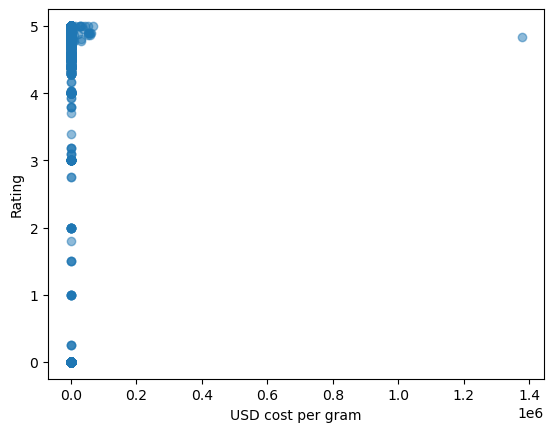

In [331]:
# visualize usd cost per gram vs rating data
plt.scatter(agora_coke['usd_cost_per_gram'], agora_coke[' Rating'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Rating')

### Outliers in Agora cocaine data

In [616]:
# create new columns to indicate if it is an outlier for price or quality
agora_coke['outlierPrice'] = 0
agora_coke['outlierRating'] = 0

# get mean and std
mean_price = agora_coke['usd_cost_per_gram'].mean()
std_price = agora_coke['usd_cost_per_gram'].std()
mean_rating = agora_coke[' Rating'].mean()
std_rating = agora_coke[' Rating'].std()

med_price = agora_coke['usd_cost_per_gram'].median()
mode_price = agora_coke['usd_cost_per_gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)
print('std price', std_price)
print('mean rating', mean_rating)
print('std rating', std_rating)
# iterate through the dataframe
for i,val in enumerate(agora_coke['usd_cost_per_gram']):
    if abs(val - mean_price) > 2 * std_price:
        agora_coke.loc[i,"outlierPrice"] = 1

for i,val in enumerate(agora_coke[' Rating']):
    if abs(val - mean_rating) > 2 * std_rating:
        agora_coke.loc[i,"outlierRating"] = 1

mean price 506.03670056953973
median price 69.2323771321627
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
std price 18671.970584489183
mean rating 4.440172465456967
std rating 1.4171455243259687


In [335]:
# count ouliers and non outliers
from collections import Counter
print(Counter(agora_coke['outlierPrice']))
print(Counter(agora_coke['outlierRating']))



Counter({0: 5996, 1: 11})
Counter({0: 5464, 1: 543})


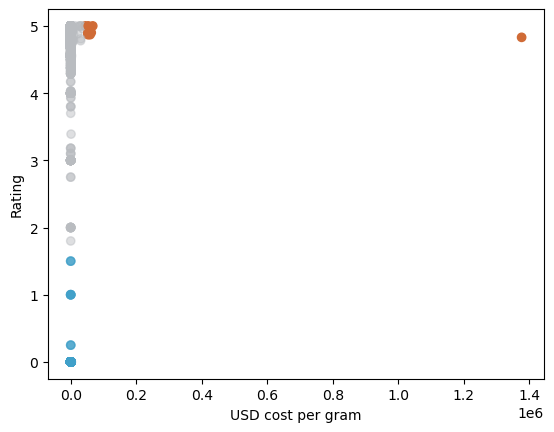

In [683]:
# code from lab feedback
# create an empty list for color
colorColumn = []

for i in range(len(agora_coke)):
    if agora_coke["outlierPrice"][i] == 1:
        colorColumn.append("#D06B36ff") # orange color
    elif agora_coke["outlierRating"][i] == 1:
        colorColumn.append("#40A0C977") # a blue color
    else:
        colorColumn.append("#B9BCC077") # gray

plt.xlabel('USD cost per gram')
plt.ylabel('Rating')
plt.scatter(agora_coke['usd_cost_per_gram'], agora_coke[' Rating'] , c = colorColumn)

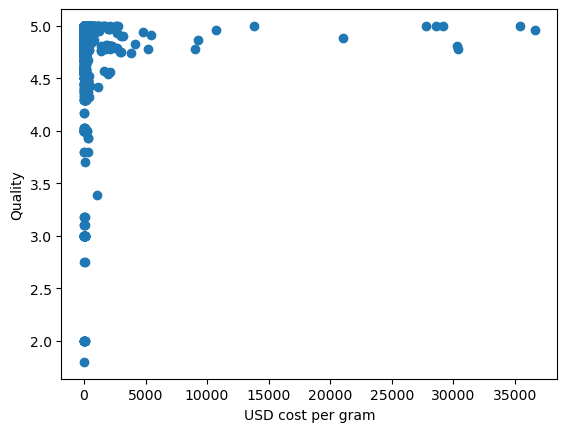

In [365]:
# Create an empty list for color
colorColumn = []

# iterate over the rows of the DataFrame
for i in range(len(agora_coke)):
    # check if it is not an outlier
    if agora_coke["outlierPrice"][i] != 1 and agora_coke["outlierRating"][i] != 1:
        colorColumn.append("#B9BCC077")  # gray
    else:
        colorColumn.append("none")  # do not plot outliers

# filter the data for nonoutliers
non_outliers = agora_coke[(agora_coke["outlierPrice"] != 1) & (agora_coke["outlierRating"] != 1)]

# plot
plt.xlabel('USD cost per gram')
plt.ylabel('Quality')
plt.scatter(non_outliers['usd_cost_per_gram'], non_outliers[' Rating'])

plt.show()

In [617]:
# get stats
condition = agora_coke['outlierPrice'] == 0
mean_price = agora_coke.loc[condition, 'usd_cost_per_gram'].mean()
all_price = agora_coke.loc[condition, 'usd_cost_per_gram'].sum()

med_price = agora_coke['usd_cost_per_gram'].median()
mode_price = agora_coke['usd_cost_per_gram'].mode()



condition1 = agora_coke['outlierRating'] == 0
mean_rating = agora_coke.loc[condition, ' Rating'].mean()
print(mean_price)
print('median price', med_price)
print('mode price', mode_price)
print(all_price)
print(mean_rating)
print(Counter(agora_coke['outlierPrice']))

157.43408294489646
median price 69.2323771321627
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
871712.5172658917
4.439302201467645
Counter({0: 5996, 1: 11})


In [455]:
agora_coke_copy = agora_coke.copy()
# get rows with outliers
outlier_rows = (agora_coke_copy["outlierPrice"] == 1) | (agora_coke_copy["outlierRating"] == 1)

# exclude outliers in dataframe
agora_coke_copy = agora_coke_copy[~outlier_rows]
print(Counter(agora_coke_copy['outlierPrice']))
print(Counter(agora_coke_copy['outlierRating']))

Counter({0: 5453})
Counter({0: 5453})


In [589]:
# get stats of dataframe with only nonoutliers
mean_price = agora_coke_copy['usd_cost_per_gram'].mean()
all_price = agora_coke_copy.loc[condition, 'usd_cost_per_gram'].sum()

mean_rating = agora_coke_copy[' Rating'].mean()

print(mean_price)
print(all_price)
print(mean_rating)

165.9566625530619
827736.2073374448
4.879553387334315


In [618]:
agora_coke_copy.drop('outlierPrice', axis=1, inplace=True)
agora_coke_copy.drop('outlierRating', axis=1, inplace=True)

agora_coke_copy['outlierPrice'] = 0
agora_coke_copy['outlierRating'] = 0 

# get mean and std
mean_price = agora_coke_copy['usd_cost_per_gram'].mean()
std_price = agora_coke_copy['usd_cost_per_gram'].std()
mean_rating = agora_coke_copy[' Rating'].mean()
std_rating = agora_coke_copy[' Rating'].std()
med_price = agora_coke_copy['usd_cost_per_gram'].median()
mode_price = agora_coke_copy['usd_cost_per_gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)
print('std price', std_price)
print('mean rating', mean_rating)
print('std rating', std_rating)
# iterate through the dataframe
for i,val in enumerate(agora_coke_copy['usd_cost_per_gram']):
    if abs(val - mean_price) > 2 * std_price:
        agora_coke_copy.loc[i,"outlierPrice"] = 1

for i,val in enumerate(agora_coke_copy[' Rating']):
    if abs(val - mean_rating) > 2 * std_rating:
        agora_coke_copy.loc[i,"outlierRating"] = 1
        
print(Counter(agora_coke_copy['outlierPrice']))
print(Counter(agora_coke_copy['outlierRating']))

mean price 165.9566625530619
median price 71.87152990938411
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
std price 1269.03453523532
mean rating 4.879553387334315
std rating 0.2648605357376091
Counter({0: 5427, 1: 22})
Counter({0: 5299, 1: 150})


In [432]:
print(agora_coke_copy.columns)


Index(['Vendor', ' Item', ' Item Description', ' Price', 'usd_price',
       'usd_cost_per_gram', ' Origin', ' Destination', ' Rating', ' Remarks',
       'outlierPrice', 'outlierRating'],
      dtype='object')


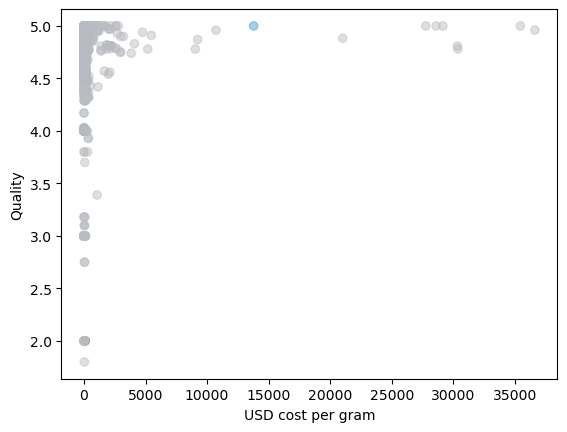

In [459]:
# reset the index
agora_coke_copy = agora_coke_copy.reset_index(drop=True)

#code from lab feedback
# create an empty list for color
colorColumn = []


for i in range(len(agora_coke_copy)):
    if agora_coke_copy["outlierPrice"][i] == 1:
        colorColumn.append("#D06B36ff") # orange color
    elif agora_coke_copy["outlierRating"][i] == 1:
        colorColumn.append("#40A0C977") # a blue color
    else:
        colorColumn.append("#B9BCC077") # gray

plt.xlabel('USD cost per gram')
plt.ylabel('Quality')
plt.scatter(agora_coke_copy['usd_cost_per_gram'], agora_coke_copy[' Rating'], c=colorColumn)


In [460]:
condition = agora_coke_copy['outlierPrice'] == 0
mean_price = agora_coke_copy.loc[condition, 'usd_cost_per_gram'].mean()

condition1 = agora_coke_copy['outlierRating'] == 0
mean_rating = agora_coke_copy.loc[condition, ' Rating'].mean()
print(mean_price)
print(mean_rating)


165.9566625530619
4.879553387334315


In [461]:
# get rows with outliers
outlier_rows = (agora_coke_copy["outlierPrice"] == 1) #| (agora_coke_copy["outlierRating"] == 1)

# exclude outliers in dataframe
agora_coke_copy = agora_coke_copy[~outlier_rows]
        
print(Counter(agora_coke_copy['outlierPrice']))
print(Counter(agora_coke_copy['outlierRating']))

Counter({0: 5449})
Counter({0: 5298, 1: 151})


In [619]:
# get stats

agora_coke_copy.drop('outlierPrice', axis=1, inplace=True)

agora_coke_copy['outlierPrice'] = 0
agora_coke_copy['outlierRating'] = 0 

# get mean and std
mean_price = agora_coke_copy['usd_cost_per_gram'].mean()
std_price = agora_coke_copy['usd_cost_per_gram'].std()
#mean_rating = agora_coke_copy[' Rating'].mean()
#std_rating = agora_coke_copy[' Rating'].std()

med_price = agora_coke_copy['usd_cost_per_gram'].median()
mode_price = agora_coke_copy['usd_cost_per_gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)
print('std price', std_price)
print('mean rating', mean_rating)
print('std rating', std_rating)
# iterate through the dataframe
for i,val in enumerate(agora_coke_copy['usd_cost_per_gram']):
    if abs(val - mean_price) > 2 * std_price:
        agora_coke_copy.loc[i,"outlierPrice"] = 1

#for i,val in enumerate(agora_coke_copy[' Rating']):
#    if abs(val - mean_rating) > 2 * std_rating:
#        agora_coke_copy.loc[i,"outlierRating"] = 1
        
print(Counter(agora_coke_copy['outlierPrice']))
#print(Counter(agora_coke_copy['outlierRating']))

mean price 165.9566625530619
median price 71.87152990938411
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
std price 1269.03453523532
mean rating 4.879553387334315
std rating 0.2648605357376091
Counter({0: 5427, 1: 22})


Text(0, 0.5, 'Rating')

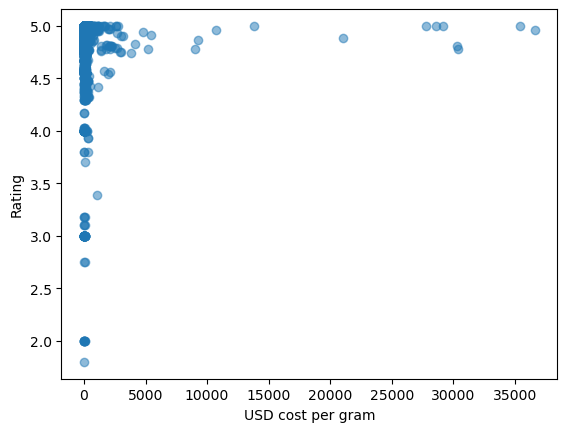

In [463]:
# visualize
plt.scatter(agora_coke_copy['usd_cost_per_gram'], agora_coke_copy[' Rating'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Rating')

In [464]:
# setting threshold
threshold_price = 5000  

mask = agora_coke_copy['usd_cost_per_gram'] < threshold_price

filtered_ac = agora_coke_copy[mask]

Text(0, 0.5, 'Rating')

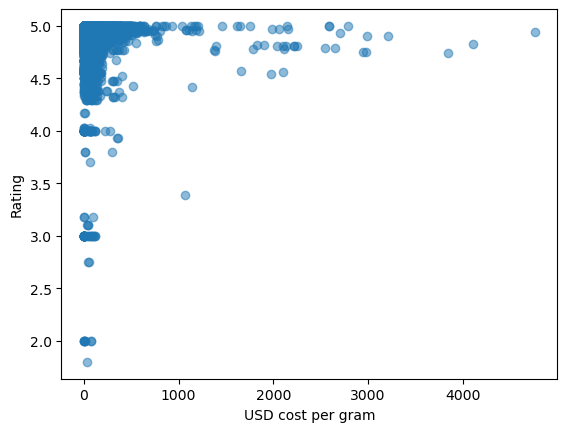

In [467]:
plt.scatter(filtered_ac['usd_cost_per_gram'], filtered_ac[' Rating'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Rating')

In [468]:
print(filtered_ac.columns)

Index(['Vendor', ' Item', ' Item Description', ' Price', 'usd_price',
       'usd_cost_per_gram', ' Origin', ' Destination', ' Rating', ' Remarks',
       'outlierRating', 'outlierPrice'],
      dtype='object')


In [620]:
filtered_ac.drop('outlierPrice', axis=1, inplace=True)
filtered_ac['outlierPrice'] = 0

# get mean and std
mean_price = filtered_ac['usd_cost_per_gram'].mean()
std_price = filtered_ac['usd_cost_per_gram'].std()
#mean_rating = agora_coke_copy[' Rating'].mean()
#std_rating = agora_coke_copy[' Rating'].std()

med_price = filtered_ac['usd_cost_per_gram'].median()
mode_price = filtered_ac['usd_cost_per_gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)
print('std price', std_price)

#print(mean_rating)
#print(std_rating)
# iterate through the dataframe
for i,val in enumerate(filtered_ac['usd_cost_per_gram']):
    if abs(val - mean_price) > 2 * std_price:
        filtered_ac.loc[i,"outlierPrice"] = 1

#for i,val in enumerate(agora_coke_copy[' Rating']):
#    if abs(val - mean_rating) > 2 * std_rating:
#        agora_coke_copy.loc[i,"outlierRating"] = 1
        
print(Counter(filtered_ac['outlierPrice']))
#print(Counter(agora_coke_copy['outlierRating']))

mean price 107.64007930143427
median price 71.4325210293546
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
std price 235.11484316116292
Counter({0: 4908, 1: 80})


In [473]:
# setting threhold to 1000
threshold_price = 1000  

mask = filtered_ac['usd_cost_per_gram'] < threshold_price

filtered_ac2 =  filtered_ac[mask]

Text(0, 0.5, 'Rating')

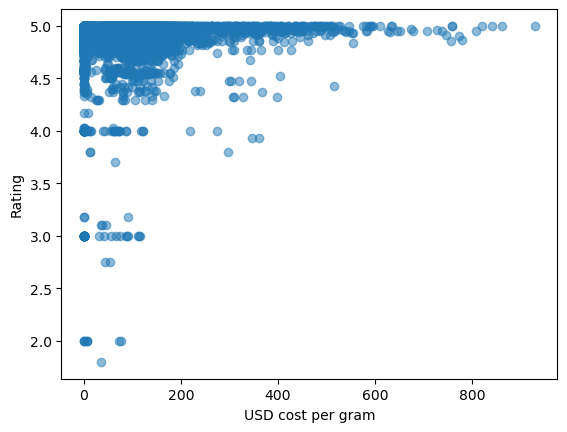

In [474]:
plt.scatter(filtered_ac2['usd_cost_per_gram'], filtered_ac2[' Rating'], alpha=0.5)
plt.xlabel('USD cost per gram')
plt.ylabel('Rating')

In [621]:
# get mean and std
mean_price = filtered_ac2['usd_cost_per_gram'].mean()
std_price = filtered_ac2['usd_cost_per_gram'].std()
#mean_rating = agora_coke_copy[' Rating'].mean()
#std_rating = agora_coke_copy[' Rating'].std()

med_price = filtered_ac2['usd_cost_per_gram'].median()
mode_price = filtered_ac2['usd_cost_per_gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)
print('std price', std_price)

mean price 88.30027549900973
median price 70.00922760131866
mode price 0     91.793475
1     92.211929
2    100.138335
Name: usd_cost_per_gram, dtype: float64
std price 107.81980128049875


### Data clustering in Agora by country

In [678]:
unique_acoke_origins = agora_coke[' Origin'].unique()
unique_acoke_origins

array(['Belgium', 'USA', 'Netherlands', 'UK', 'uk', 'Germany', 'Italy',
       'EU', nan, 'China', ' USA  Scandinavia and Alaska',
       'Germany Norway  Finland', 'Canada', 'Bolivia', 'Ireland',
       'Canada USA  UK  EU', 'Argentina', 'Colombia', 'Spain',
       'Australia', 'Guatemala', 'France', 'usa', 'Mexico',
       'UntiedKingdom', 'Sweden', 'CzechRepublic', 'Peru', 'World',
       'UnitedKingdom', 'Spain mars & jupiter', 'Canada New Zealand',
       'Netherlands AUS  NZ  Scandinavia)', 'NewZealand',
       'Netherlands USA  Scandinavia and New Zealand', 'GermanyWORLDWIDE',
       'Agora', 'Denmark EU  Scandinavia', 'Internet',
       ' USA  Scandinavia and New Zealand', 'Brazil', 'undeclared',
       'Netherlands Except Scandinavia', 'TheUnitedSnakes',
       'Canada Europe  Asia  Oceania', 'UKandIreland', 'Norway',
       'Canada USA  UK', 'Denmark', 'Canada US  UK', 'Torland',
       'Switzerland', 'Germany EU', 'Netherlands UK', 'Sweden Norway',
       'USA Uk&', 'UK EU',

In [679]:
strings_origins = agora_coke[' Origin'].astype(str).tolist()
strings_origins

['Belgium',
 'USA',
 'Netherlands',
 'USA',
 'Netherlands',
 'USA',
 'USA',
 'USA',
 'UK',
 'uk',
 'Germany',
 'UK',
 'Italy',
 'EU',
 'USA',
 'UK',
 'UK',
 'Netherlands',
 'UK',
 'USA',
 'Netherlands',
 'Germany',
 'nan',
 'Netherlands',
 'USA',
 'USA',
 'China',
 'Germany',
 'USA',
 'USA',
 'Netherlands',
 'EU',
 'UK',
 'UK',
 'Belgium',
 'Belgium',
 'Germany',
 'Germany',
 'Netherlands',
 'UK',
 'Belgium',
 'Germany',
 'Netherlands',
 'UK',
 'Netherlands',
 'Netherlands',
 ' USA  Scandinavia and Alaska',
 'Germany Norway  Finland',
 'nan',
 'USA',
 'USA',
 'nan',
 'Netherlands',
 'Germany',
 'Netherlands',
 'USA',
 'UK',
 'Netherlands',
 'Netherlands',
 'UK',
 'USA',
 'Netherlands',
 'Canada',
 'Bolivia',
 'Bolivia',
 'nan',
 'UK',
 'UK',
 'Bolivia',
 'UK',
 'Netherlands',
 'USA',
 'UK',
 'UK',
 'Germany',
 'Netherlands',
 'Canada',
 'EU',
 'USA',
 'USA',
 'Germany',
 'USA',
 'Ireland',
 'Canada USA  UK  EU',
 'USA',
 'USA',
 'EU',
 'Netherlands',
 'Argentina',
 'Netherlands',
 'Net

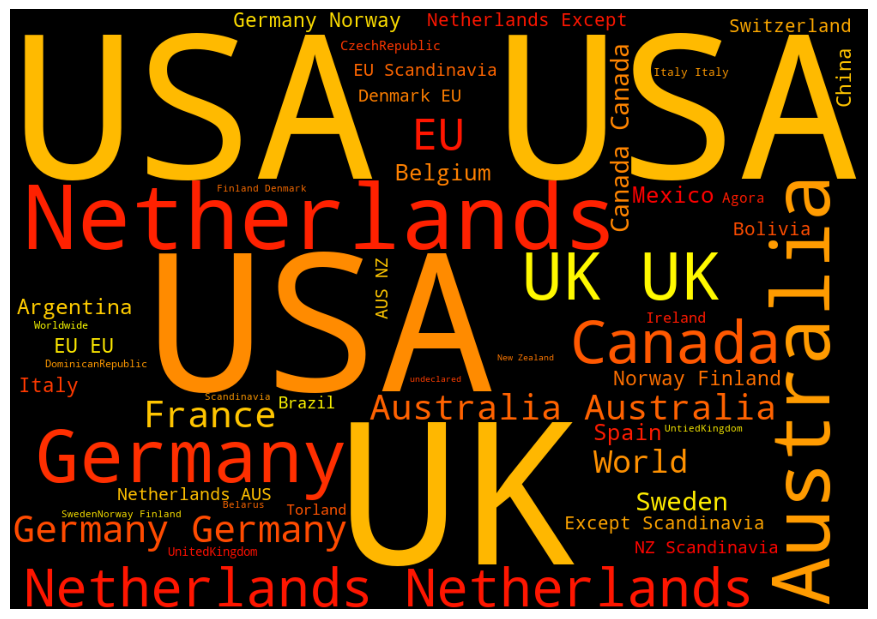

In [680]:
strings_origins = [title.replace('nan', '') for title in strings_origins]

text_data = ' '.join(strings_origins)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data) 

# plot wordcloud                       
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()


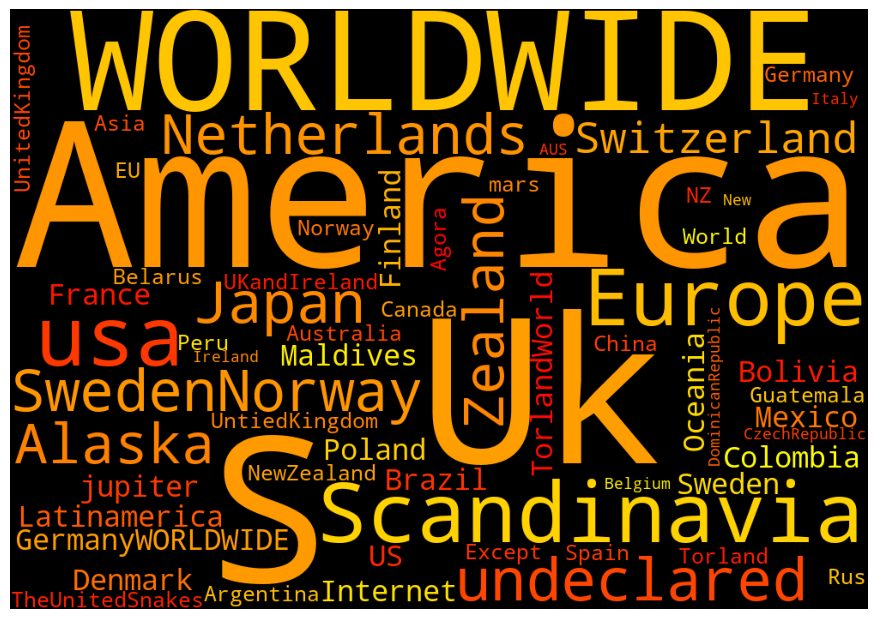

In [681]:
# remove 'nan' from strings_origins
strings_origins = [title.replace('nan', '') for title in strings_origins]

# unique words
unique_words = set()

# only add uique words
for title in strings_origins:
    unique_words.update(title.split())


text_data = ' '.join(unique_words)


wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

# plot wordcloud                        
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()


In [725]:
# USA cocaine stats on agora

us_agora_coke = filtered_ac2[filtered_ac2[' Origin'].str.lower().isin(['usa', 'america', 'us'])]
us_agora_coke_mean_cost = us_agora_coke['usd_cost_per_gram'].mean()
us_agora_coke_mean_rating = us_agora_coke[' Rating'].mean()
print('mean cost', us_agora_coke_mean_cost)
print('mean rating', us_agora_coke_mean_rating )
print('rows', len(us_agora_coke))

mean cost 77.92359260623921
mean rating 4.867128829536528
rows 1273


In [726]:
# UK cocaine stats on agora

uk_agora_coke = filtered_ac2[filtered_ac2[' Origin'].str.lower().isin(['uk', 'united kingdom'])]
uk_agora_coke_mean_cost = uk_agora_coke['usd_cost_per_gram'].mean()
uk_agora_coke_mean_rating = uk_agora_coke[' Rating'].mean()
print('mean cost', uk_agora_coke_mean_cost)
print('mean rating', uk_agora_coke_mean_rating )
print('rows', len(uk_agora_coke))

mean cost 88.8450922801327
mean rating 4.901938242280285
rows 842


In [727]:
# netherlands cocaine stats on agora

nl_agora_coke = filtered_ac2[filtered_ac2[' Origin'].str.lower().isin(['netherlands'])]
nl_agora_coke_mean_cost = nl_agora_coke['usd_cost_per_gram'].mean()
nl_agora_coke_mean_rating = nl_agora_coke[' Rating'].mean()
print('mean cost', nl_agora_coke_mean_cost)
print('mean rating', nl_agora_coke_mean_rating )
print('rows', len(nl_agora_coke))

mean cost 52.04161903680114
mean rating 4.830413694721826
rows 701


In [728]:
# australia cocine stats on agora

au_agora_coke = filtered_ac2[filtered_ac2[' Origin'].str.lower().isin(['australia', 'au'])]
au_agora_coke_mean_cost = au_agora_coke['usd_cost_per_gram'].mean()
au_agora_coke_mean_rating = au_agora_coke[' Rating'].mean()
print('mean cost', au_agora_coke_mean_cost)
print('mean rating', au_agora_coke_mean_rating )
print('rows', len(au_agora_coke))

mean cost 251.7637082503588
mean rating 4.939389221556886
rows 501


# Valhalla

## Data prepration and derivation

In [684]:
val

,ID,Item,Vendor,Price,Origin
0,10086,Hacking for Profit: Credit Card Fraud A Beginn...,junkiepig666,2.73 EUR,Germany
1,10087,Introduction to Social Engineering,junkiepig666,2.73 EUR,Germany
2,10096,MST Morphine sulphate tablets 100 mg =30$,pure12,29.14 EUR,United Kingdom
3,10097,MORPHINE SULPHATE TABLETS (CONTINUS) 30$ =10...,pure12,29.14 EUR,United Kingdom
4,10099,Learn The Basics of Ethical Hacking and Penet...,junkiepig666,18.22 EUR,Germany
...,...,...,...,...,...
16506,9872,If an Agent Knocks: Federal Investigators and ...,junkiepig666,2.73 EUR,Germany
16507,9874,C.I.A - Book of Dirty Tricks,junkiepig666,2.73 EUR,Germany
16508,9875,How to be Invisible - Private Investigator Sec...,junkiepig666,2.73 EUR,Germany
16509,9876,How to Change Your Identity,junkiepig666,2.73 EUR,Germany


In [685]:
missing_vals = val.isnull().sum()
missing_vals

ID        0
Item      0
Vendor    0
Price     0
Origin    0
dtype: int64

### Derive USD cost

In [686]:
val['Price'] = val['Price'].apply(lambda x: pd.to_numeric(''.join(filter(lambda c: c.isdigit() or c == '.', str(x))), errors='coerce'))

# convert the column to float type
val['Price'] = val['Price'].astype(float)

val

,ID,Item,Vendor,Price,Origin
0,10086,Hacking for Profit: Credit Card Fraud A Beginn...,junkiepig666,2.73,Germany
1,10087,Introduction to Social Engineering,junkiepig666,2.73,Germany
2,10096,MST Morphine sulphate tablets 100 mg =30$,pure12,29.14,United Kingdom
3,10097,MORPHINE SULPHATE TABLETS (CONTINUS) 30$ =10...,pure12,29.14,United Kingdom
4,10099,Learn The Basics of Ethical Hacking and Penet...,junkiepig666,18.22,Germany
...,...,...,...,...,...
16506,9872,If an Agent Knocks: Federal Investigators and ...,junkiepig666,2.73,Germany
16507,9874,C.I.A - Book of Dirty Tricks,junkiepig666,2.73,Germany
16508,9875,How to be Invisible - Private Investigator Sec...,junkiepig666,2.73,Germany
16509,9876,How to Change Your Identity,junkiepig666,2.73,Germany


In [687]:
us_price = []
for i, value in enumerate(val['Price']):
    usd = value * (1.1136) # avg euro to usd conversion in 2016 from https://www.poundsterlinglive.com/history/EUR-USD-2016
    us_price.append(usd)
val.insert(4, 'USD Price', us_price)



In [688]:
val

,ID,Item,Vendor,Price,USD Price,Origin
0,10086,Hacking for Profit: Credit Card Fraud A Beginn...,junkiepig666,2.73,3.040128,Germany
1,10087,Introduction to Social Engineering,junkiepig666,2.73,3.040128,Germany
2,10096,MST Morphine sulphate tablets 100 mg =30$,pure12,29.14,32.450304,United Kingdom
3,10097,MORPHINE SULPHATE TABLETS (CONTINUS) 30$ =10...,pure12,29.14,32.450304,United Kingdom
4,10099,Learn The Basics of Ethical Hacking and Penet...,junkiepig666,18.22,20.289792,Germany
...,...,...,...,...,...,...
16506,9872,If an Agent Knocks: Federal Investigators and ...,junkiepig666,2.73,3.040128,Germany
16507,9874,C.I.A - Book of Dirty Tricks,junkiepig666,2.73,3.040128,Germany
16508,9875,How to be Invisible - Private Investigator Sec...,junkiepig666,2.73,3.040128,Germany
16509,9876,How to Change Your Identity,junkiepig666,2.73,3.040128,Germany


In [689]:
# check for missing values
missing_vals = val.isnull().sum()
missing_vals

ID           0
Item         0
Vendor       0
Price        0
USD Price    0
Origin       0
dtype: int64

### Text analysis for Valhalla's listings

In [507]:
strings_origins_val = val['Origin'].astype(str).tolist()


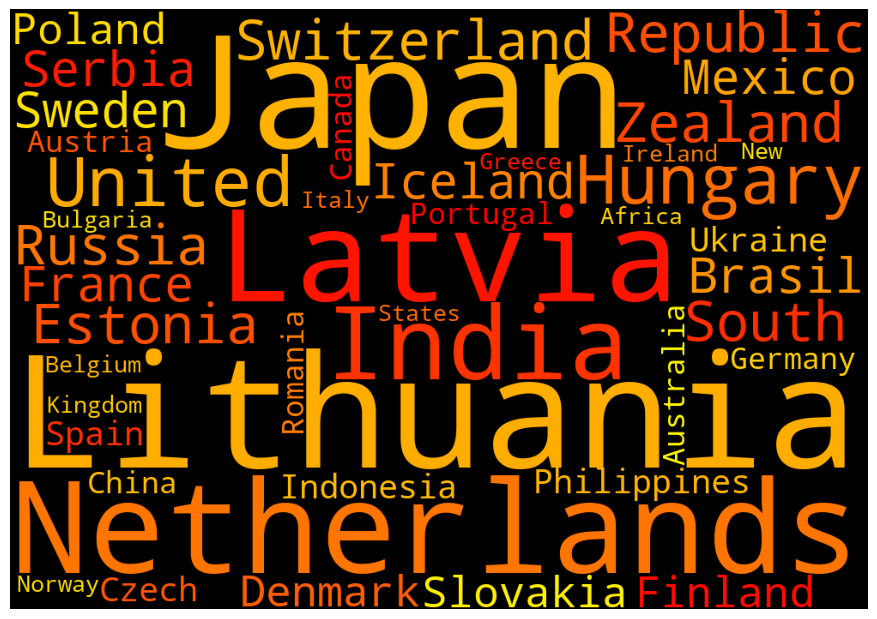

In [502]:
# wordcloud to see countries on valhalla
# unique words
unique_words = set()

# only add unique words
for title in strings_origins_val:
    unique_words.update(title.split())


text_data = ' '.join(unique_words)


wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

# plot wordcloud                        
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

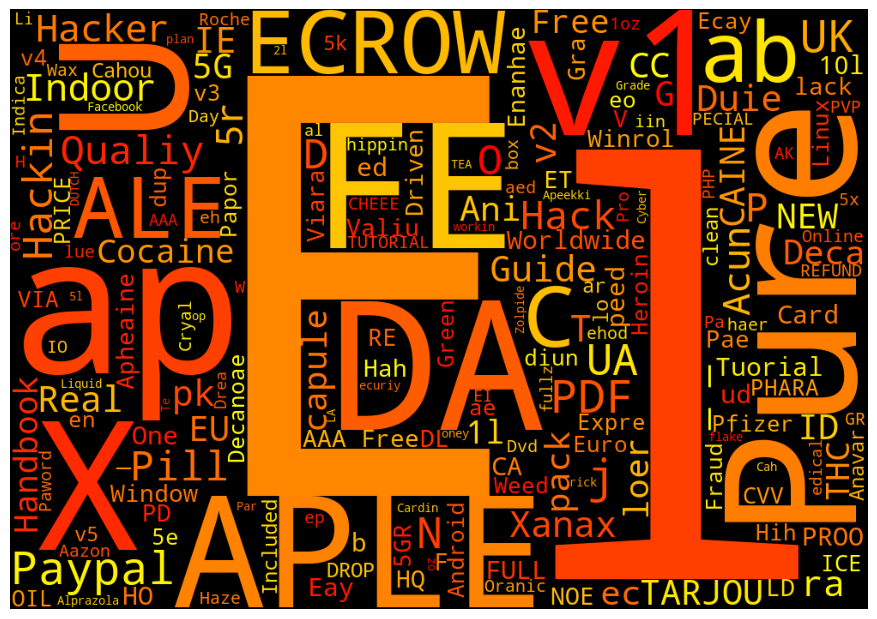

In [798]:
# wordcloud for item descriptions on valhalla
strings_item_val = val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('kpl', '') for title in strings_item_val]
strings_item_val = [title.replace('FREE', '') for title in strings_item_val]
strings_item_val = [title.replace('offer', '') for title in strings_item_val]
strings_item_val = [title.replace('g', '') for title in strings_item_val]
strings_item_val = [title.replace('5g', '') for title in strings_item_val]
strings_item_val = [title.replace('OFFER', '') for title in strings_item_val]
strings_item_val = [title.replace('S', '') for title in strings_item_val]
strings_item_val = [title.replace('t', '') for title in strings_item_val]
strings_item_val = [title.replace('m', '') for title in strings_item_val]
strings_item_val = [title.replace('B', '') for title in strings_item_val]
strings_item_val = [title.replace('s', '') for title in strings_item_val]
strings_item_val = [title.replace('co', '') for title in strings_item_val]
strings_item_val = [title.replace('CO', '') for title in strings_item_val]
strings_item_val = [title.replace('M', '') for title in strings_item_val]

#strings_item_val = [title.replace('1', '') for title in strings_item_val]
#strings_item_val = [title.replace('1 ', '') for title in strings_item_val]
#strings_item_val = [title.replace('co', '') for title in strings_item_val]
#strings_item_val = [title.replace(' 1', '') for title in strings_item_val]
#strings_item_val = [title.replace('E', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

# plot wordcloud                       
plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

## Data cluster by country in Valhalla

In [521]:
unique_origins_val = val['Origin'].unique()
unique_origins_val

array([' Germany', ' United Kingdom', ' Austria', ' Finland', ' China',
       ' Norway', ' Netherlands', ' France', ' Philippines', ' Canada',
       ' Belgium', ' United States', ' Spain', ' Australia',
       ' Czech Republic', ' Poland', ' Lithuania', ' South Africa',
       ' Denmark', ' Sweden', ' Iceland', ' Latvia', ' India',
       ' Slovakia', ' Ukraine', ' Romania', ' Ireland', ' Greece',
       ' Portugal', ' Italy', ' Estonia', ' Indonesia', ' Mexico',
       ' Brasil', ' Serbia', ' Bulgaria', ' Switzerland', ' New Zealand',
       ' Russia', ' Hungary', ' Japan'], dtype=object)

In [522]:
# function to cluster rows in a new df by country of origin
def new_df_val(country):
    condition = val['Origin'] == country

    # filter rows based on the condition
    new_df = val[condition].copy()

    # reset the index of the nl_df
    new_df = new_df.reset_index(drop=True)
    
    return new_df

ge_val = new_df_val(' Germany')
uk_val = new_df_val(' United Kingdom')
at_val = new_df_val(' Austria')
fi_val = new_df_val(' Finland')
cn_val = new_df_val(' China')
no_val = new_df_val(' Norway')
nl_val = new_df_val(' Netherlands')
fr_val = new_df_val(' France')
ph_val = new_df_val(' Philippines')
ca_val = new_df_val(' Canada')
be_val = new_df_val(' Belgium')
us_val = new_df_val(' United States')
es_val = new_df_val(' Spain')
au_val = new_df_val(' Australia')
cz_val = new_df_val(' Czech Republic')
pl_val = new_df_val(' Poland')
lt_val = new_df_val(' Lithuania')
za_val = new_df_val(' South Africa')
de_val = new_df_val(' Denmark')
se_val = new_df_val(' Sweden')
is_val = new_df_val(' Iceland')
lv_val = new_df_val(' Latvia')
in_val = new_df_val(' India')
sk_val = new_df_val(' Slovakia')
ua_val = new_df_val(' Ukraine')
ie_val = new_df_val(' Ireland')
gr_val = new_df_val(' Greece')
pt_val = new_df_val(' Portugal')
it_val = new_df_val(' Italy')
ee_val = new_df_val(' Estonia')
mx_val = new_df_val(' Mexico')
br_val = new_df_val(' Brasil')
sr_val = new_df_val(' Serbia')
bg_val = new_df_val(' Bulgaria')
ch_val = new_df_val(' Switzerland')
nz_val = new_df_val(' New Zealand')
ru_val = new_df_val(' Russia')
hu_val = new_df_val(' Hungary')
jp_val = new_df_val(' Japan')

In [524]:
ge_rows = len(ge_val)
uk_rows = len(uk_val)
at_rows = len(at_val)
fi_rows = len(fi_val)
cn_rows = len(cn_val)
no_rows = len(no_val)
nl_rows = len(nl_val)
fr_rows = len(fr_val)
ph_rows = len(ph_val)
ca_rows = len(ca_val)
be_rows = len(be_val)
us_rows = len(us_val)
es_rows = len(es_val)
au_rows = len(au_val)
cz_rows = len(cz_val)
pl_rows = len(pl_val)
lt_rows = len(lt_val)
za_rows = len(za_val)
de_rows = len(de_val)
se_rows = len(se_val)
is_rows = len(is_val)
lv_rows = len(lv_val)
in_rows = len(in_val)
sk_rows = len(sk_val)
ua_rows = len(ua_val)
ie_rows = len(ie_val)
gr_rows = len(gr_val)
pt_rows = len(pt_val)
it_rows = len(it_val)
ee_rows = len(ee_val)
mx_rows = len(mx_val)
br_rows = len(br_val)
sr_rows = len(sr_val)
bg_rows = len(bg_val)
ch_rows = len(ch_val)
nz_rows = len(nz_val)
ru_rows = len(ru_val)
hu_rows = len(hu_val)
jp_rows = len(jp_val)

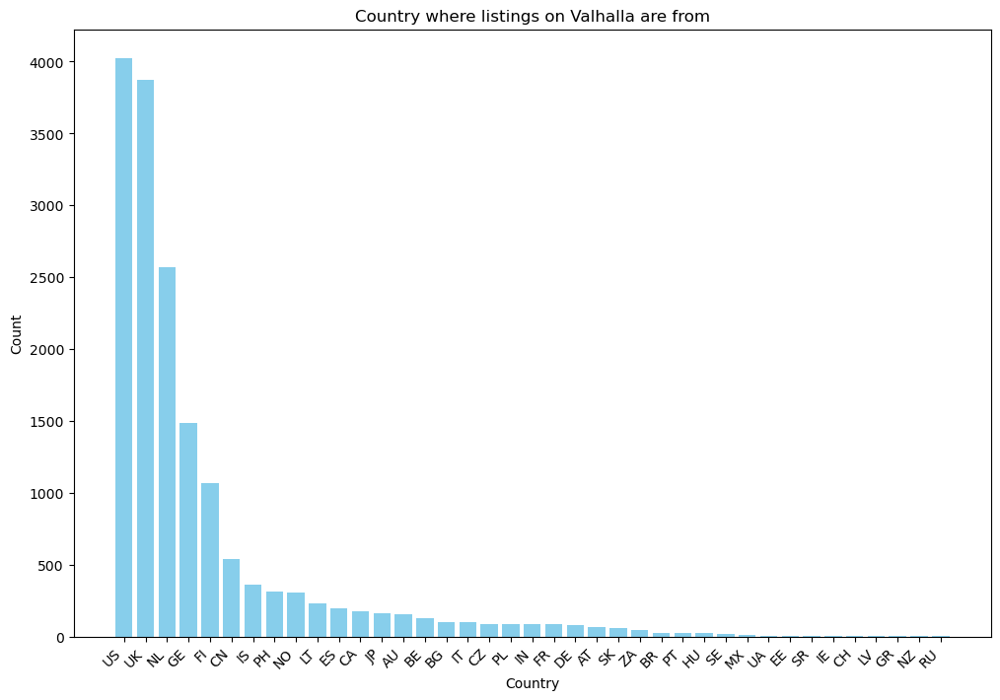

In [528]:
# Data for the bar graph
labels = ['GE', 'UK', 'AT', 'FI', 'CN', 'NO', 'NL', 'FR', 'PH', 'CA', 'BE', 'US', 'ES', 'AU', 'CZ', 'PL', 'LT',
         'ZA','DE','SE','IS','LV','IN','SK','UA','IE','GR','PT','IT','EE','MX','BR','SR','BG','CH','NZ','RU',
         'HU','JP']
sizes = [ge_rows, uk_rows, at_rows, fi_rows, cn_rows,no_rows,nl_rows,fr_rows,ph_rows,ca_rows,be_rows,us_rows,
         es_rows,au_rows,cz_rows,pl_rows,lt_rows,za_rows,de_rows,se_rows,is_rows,lv_rows,in_rows,sk_rows,ua_rows,
         ie_rows,gr_rows,pt_rows,it_rows,ee_rows,mx_rows,br_rows,sr_rows,bg_rows,ch_rows,nz_rows,ru_rows,hu_rows,
         jp_rows] 

# Combine labels and sizes into a list of tuples and sort by sizes in descending order
data_sorted = sorted(zip(labels, sizes), key=lambda x: x[1], reverse=True)

# Unpack the sorted data
labels_sorted, sizes_sorted = zip(*data_sorted)

# Plot the bar graph
plt.figure(figsize=(12, 8))
plt.bar(labels_sorted, sizes_sorted, color='skyblue')
plt.title('Country where listings on Valhalla are from')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Display the bar graph
plt.show()

In [ ]:
def get_stats_val(df):
    qual_mean = df['quality'].mean()
    total_trans = df['successful_transactions'].sum()
    avg_cost = df['usd_cost_per_gram'].mean()
    med_cost = df['usd_cost_per_gram'].median()
    mode_cost = df['usd_cost_per_gram'].mode()
    avg_cost_pure = df['usd_cost_per_gram_pure'].mean()
    avg_rating = df['rating'].mean()
    escrow = df['escrow'].sum()
    total_rows = len(df)
    print('transactions',total_trans)
    print('avg quality', qual_mean)
    print('avg cost per gram', avg_cost)
    print('median cost per gram', med_cost)
    print('mode cost per gram', mode_cost)
    print('avg cost per gram pure', avg_cost_pure)
    print('avg rating', avg_rating)
    print('escrow offered', escrow, 'out of', total_rows)

In [704]:
nl_val

,ID,Item,Vendor,Price,USD Price,Origin
0,10912,Anastrozole - 28 tb/1 mg - Accord,SteroidWarehouse,63.0,70.1568,Netherlands
1,10913,Clenbuterol - 50 tb/20 mcg - Sopharma,SteroidWarehouse,28.0,31.1808,Netherlands
2,10916,Danabol - 60 tb/10 mg - Balkan Pharma,SteroidWarehouse,38.0,42.3168,Netherlands
3,10917,Proviron - 20 tb/ 25 mg - Bayer Schering,SteroidWarehouse,43.0,47.8848,Netherlands
4,11949,Pregnyl - 5000 IU - Bayer Schering / Organon,SteroidWarehouse,33.0,36.7488,Netherlands
...,...,...,...,...,...,...
2566,68503,5 gr Bolivian Clean Uncut Cocain,stealthydrugs,367.0,408.6912,Netherlands
2567,68504,10 gr Bolivian Clean Uncut Cocain,stealthydrugs,682.0,759.4752,Netherlands
2568,68505,20 gr Bolivian Clean Uncut Cocain,stealthydrugs,1252.0,1394.2272,Netherlands
2569,68566,10gr ***** Amfetamine / Speed ***** Dutch-Stor...,Dutch-Store,40.0,44.5440,Netherlands


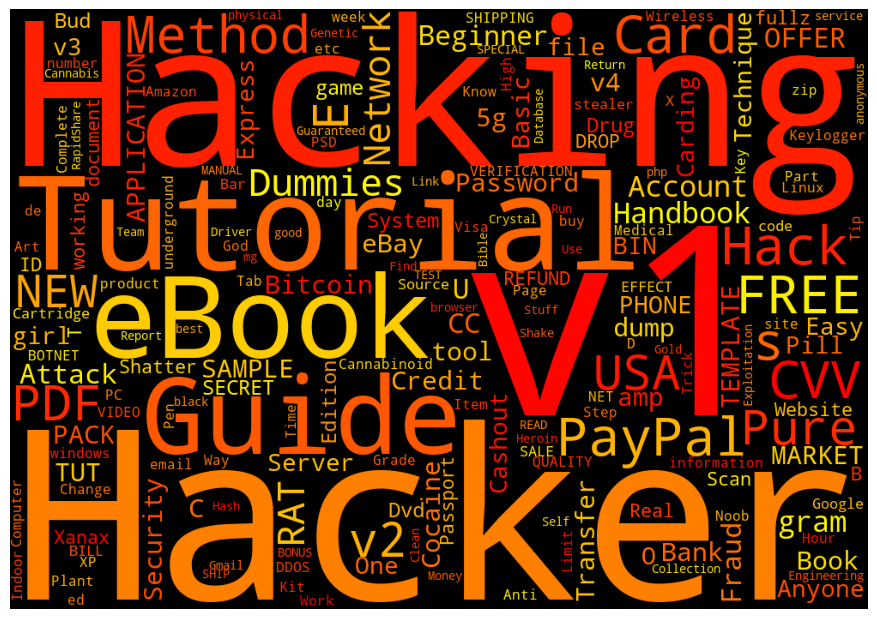

In [533]:
# wordcloud for most listed items from USA

strings_item_val = us_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

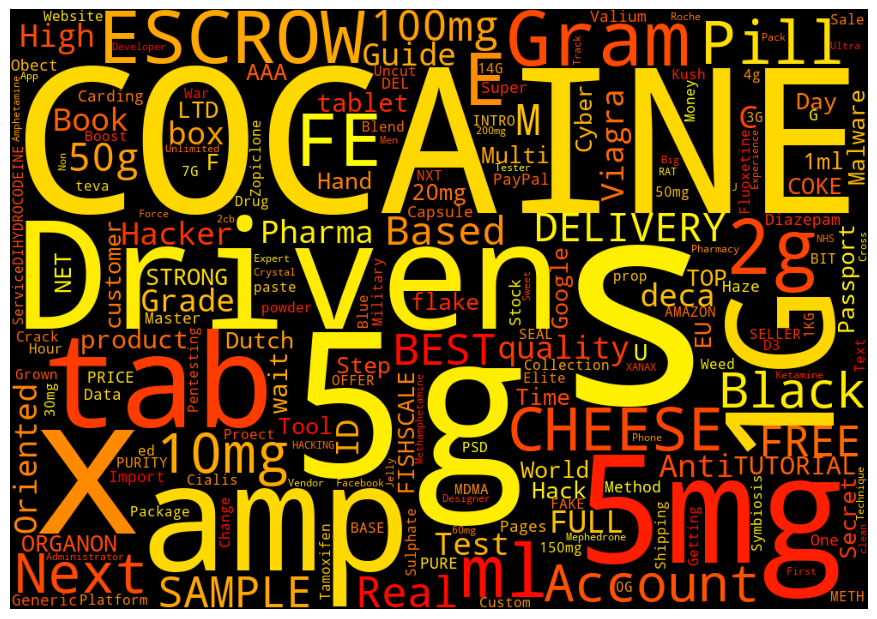

In [539]:
# wordcloud for most lsited items from UK

strings_item_val = uk_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('UK', '') for title in strings_item_val]
strings_item_val = [title.replace('Free', '') for title in strings_item_val]
strings_item_val = [title.replace('SALE', '') for title in strings_item_val]
strings_item_val = [title.replace('j', '') for title in strings_item_val]
strings_item_val = [title.replace('gram', '') for title in strings_item_val]


unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

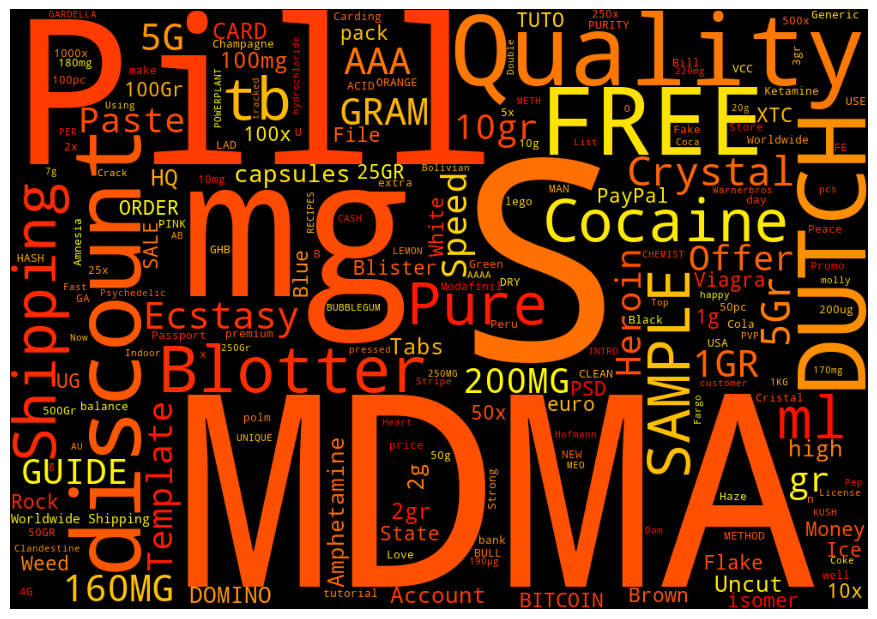

In [543]:
# wordcloud for most listed items from netherlands

strings_item_val = nl_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('OFFER', '') for title in strings_item_val]
strings_item_val = [title.replace('Sample', '') for title in strings_item_val]
strings_item_val = [title.replace('5gr', '') for title in strings_item_val]
strings_item_val = [title.replace('5g', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

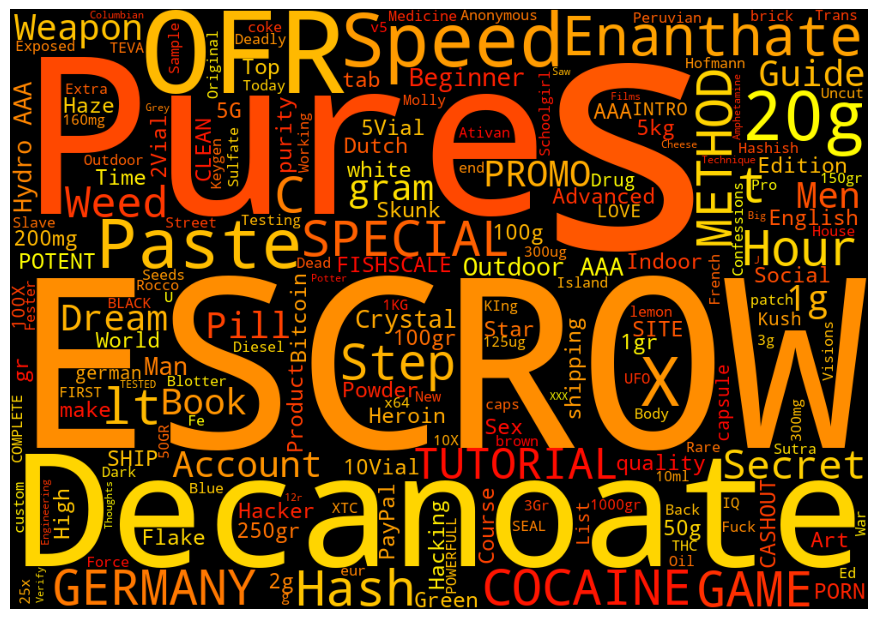

In [551]:
# wordcloud for most listed items from germany
strings_item_val = ge_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('Free', '') for title in strings_item_val]
strings_item_val = [title.replace('5g', '') for title in strings_item_val]
strings_item_val = [title.replace('10g', '') for title in strings_item_val]
strings_item_val = [title.replace('FE', '') for title in strings_item_val]
strings_item_val = [title.replace('Gram', '') for title in strings_item_val]
strings_item_val = [title.replace('gt', '') for title in strings_item_val]


unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

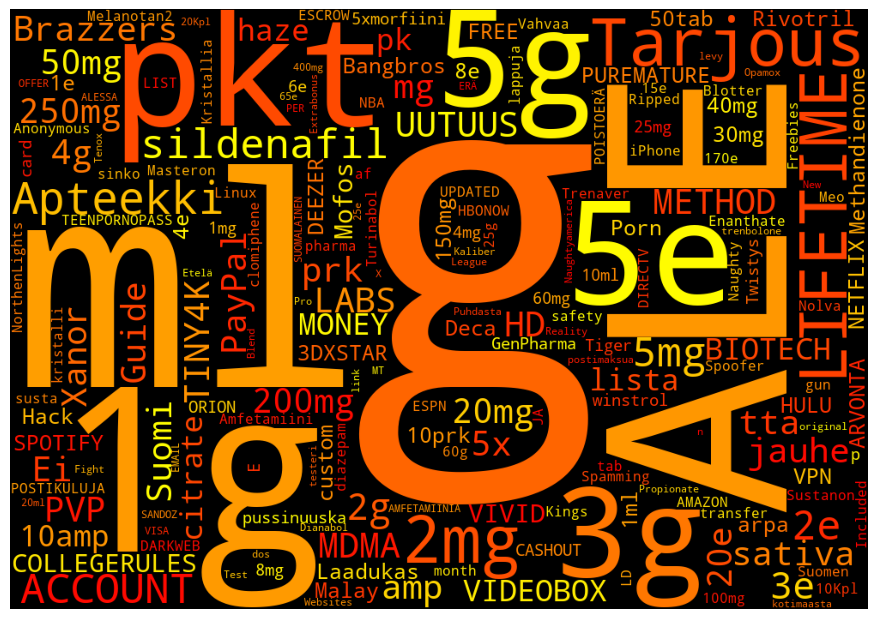

In [555]:
# wordcloud for most listed items from finland
strings_item_val = fi_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('TARJOUS', '') for title in strings_item_val]
strings_item_val = [title.replace('kpl', '') for title in strings_item_val]
strings_item_val = [title.replace('10mg', '') for title in strings_item_val]
strings_item_val = [title.replace('FREEBIES', '') for title in strings_item_val]

#strings_item_val = [title.replace('FE', '') for title in strings_item_val]
#strings_item_val = [title.replace('Gram', '') for title in strings_item_val]
#strings_item_val = [title.replace('gt', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

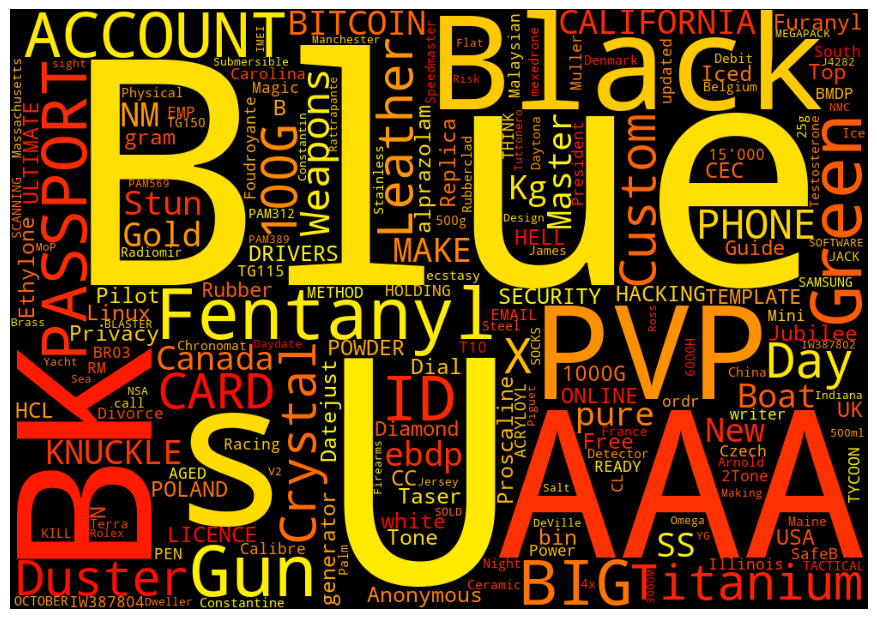

In [557]:
# wordcloud for most listed items from china
strings_item_val = cn_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('Gram', '') for title in strings_item_val]


unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

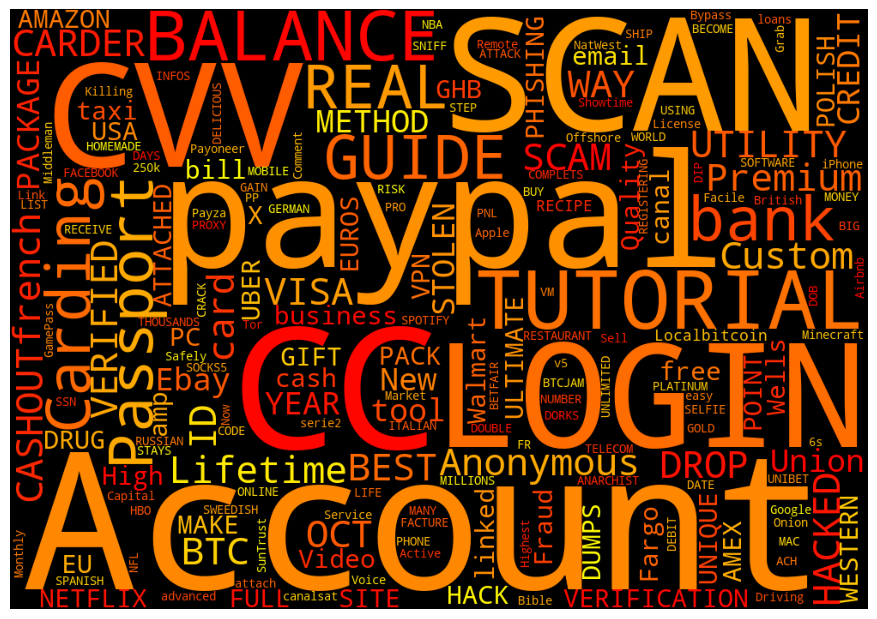

In [558]:
# wordcloud for most listed item from iceland
strings_item_val = is_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

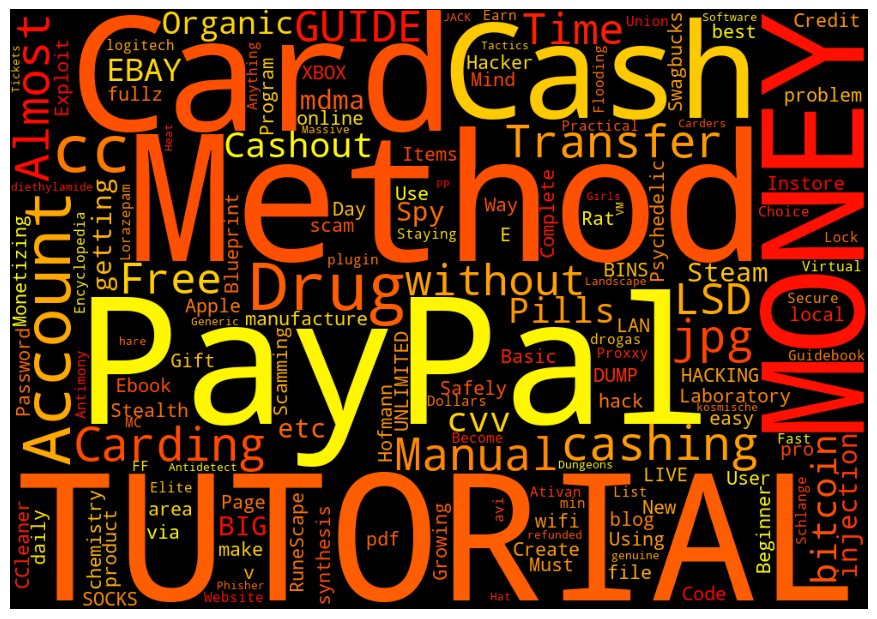

In [559]:
# wordcloud for most listed items from phillipines
strings_item_val = ph_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

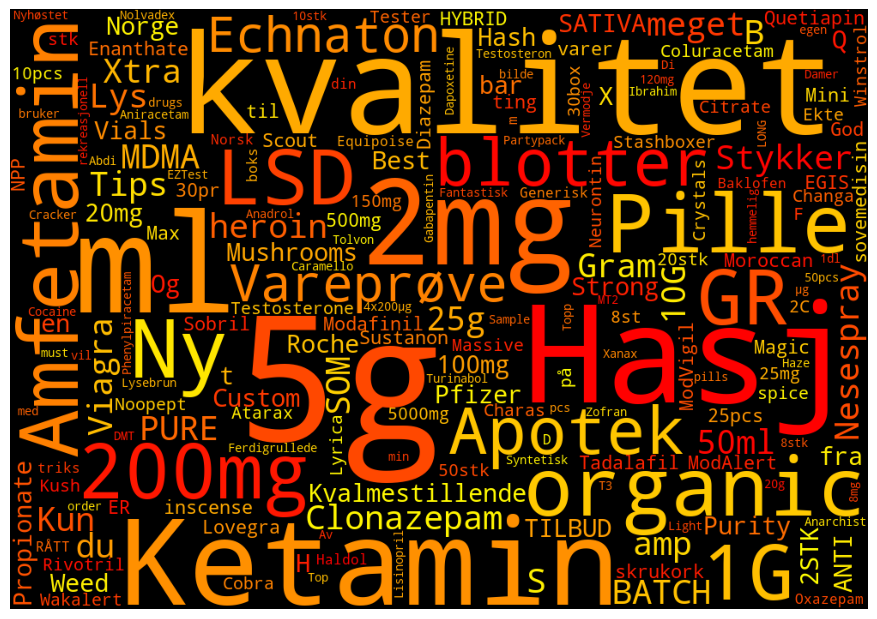

In [563]:
# wordcloud for most listed items from norway

strings_item_val = no_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]

strings_item_val = [title.replace('NORGE', '') for title in strings_item_val]
strings_item_val = [title.replace('gram', '') for title in strings_item_val]
strings_item_val = [title.replace('Batch', '') for title in strings_item_val]
strings_item_val = [title.replace('NORWAY', '') for title in strings_item_val]


unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

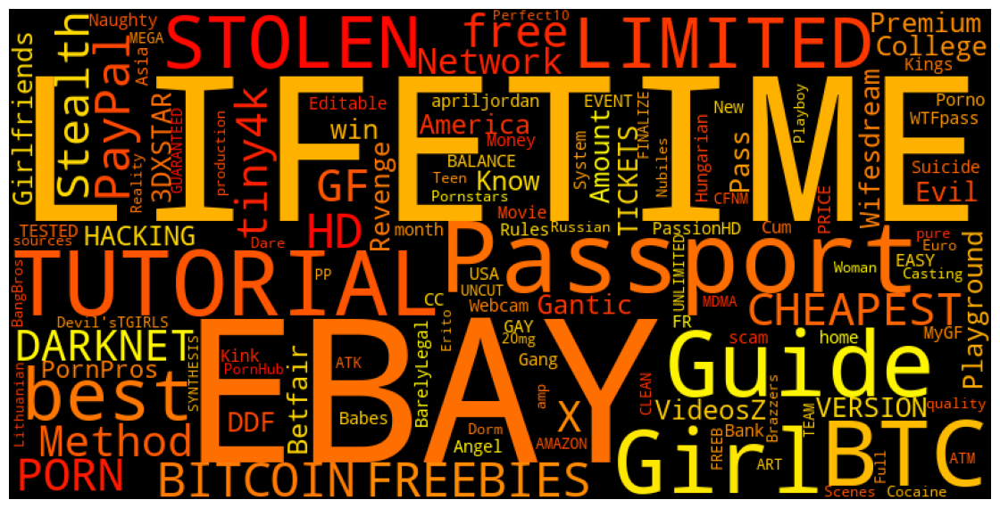

In [567]:
# wordcloud for most listed items from lithuania

strings_item_val = lt_val['Item'].astype(str).tolist()
strings_item_val = [title.replace('quot', '') for title in strings_item_val]
strings_item_val = [title.replace('00g', '') for title in strings_item_val]



unique_words = set()

for title in strings_item_val:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=800, height=400, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

## Valhalla cocaine data

In [569]:
# extract cocaine data and put in new dataframe
val_coke = val[val['Item'].str.contains('cocaine', case=False)]

In [570]:
val_coke

,ID,Item,Vendor,Price,USD Price,Origin
21,10266,0.5G COLOMBIAN FISHSCALE COCAINE-UK SELLER FAS...,drugkings,49.90,55.568640,United Kingdom
22,10271,"0.5G PURE QUALITY FISHSCALE COCAINE,UK SELLER,...",drugkings,28.83,32.105088,United Kingdom
187,12260,1g Cocaine Grade AA++,lawpee911,148.60,165.480960,United States
188,12261,1g Cocaine Grade B,lawpee911,75.59,84.177024,United States
303,13407,INTRO OFFER 1G COLOMBIAN FISHSCALE COCAINE 100...,drugkings,85.40,95.101440,United Kingdom
...,...,...,...,...,...,...
15747,68078,3.5g PURE FISHSCALE COCAINE FROM UNCUTKING *FA...,uncutkingg,244.88,272.698368,United States
15748,68079,7g PURE FISHSCALE COCAINE FROM UNCUTKING *FAST...,uncutkingg,487.11,542.445696,United States
15749,68080,14g PURE FISHSCALE COCAINE FROM UNCUTKING *FAS...,uncutkingg,837.72,932.884992,United States
15750,68081,28g PURE FISHSCALE COCAINE FROM UNCUTKING *FAS...,uncutkingg,1557.14,1734.031104,United States


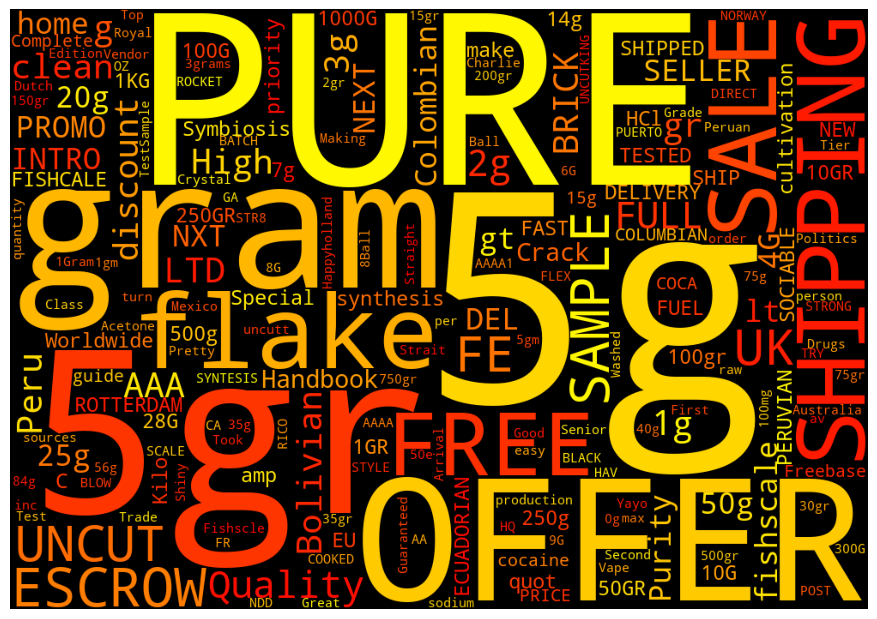

In [791]:
# wordcloud for most used words in valhallas cocaine listings

strings_items = val_coke['Item'].astype(str).tolist()
strings_items= [title.replace('nan', '') for title in strings_items]
strings_items= [title.replace('Cocaine', '') for title in strings_items]
strings_items= [title.replace('COCAINE', '') for title in strings_items]

unique_words = set()

for title in strings_items:
    unique_words.update(title.split())

text_data = ' '.join(unique_words)

wordcloud = WordCloud(width=1000, height=700, 
                      background_color='black', colormap=plt.cm.autumn,
                      min_font_size=10).generate(text_data)

plt.figure(figsize=(11, 6), facecolor=None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad=0) 
plt.show()

In [571]:
# valhalla cocaine listings by country

val_coke_unique_origins = val_coke['Origin'].unique()
val_coke_unique_origins

array([' United Kingdom', ' United States', ' Netherlands', ' France',
       ' Denmark', ' Norway', ' Belgium', ' Lithuania', ' Canada',
       ' Germany', ' Mexico', ' Italy', ' Spain', ' Slovakia', ' Brasil',
       ' Bulgaria'], dtype=object)

In [572]:
uk_val_coke = 0
us_val_coke = 0
nl_val_coke = 0
fr_val_coke = 0
de_val_coke = 0
no_val_coke = 0
be_val_coke = 0
lt_val_coke = 0
ca_val_coke = 0
ge_val_coke = 0
mx_val_coke = 0
it_val_coke = 0
es_val_coke = 0
sk_val_coke = 0
br_val_coke = 0
bg_val_coke = 0
for i, value in enumerate(val_coke['Origin']):
    if value == ' United Kingdom':
        uk_val_coke = uk_val_coke + 1
    elif value == ' United States':
        us_val_coke = us_val_coke + 1
    elif value == ' Netherlands':
        nl_val_coke = nl_val_coke + 1
    elif value == ' France':
        fr_val_coke = fr_val_coke + 1
    elif value == ' Denmark':
        de_val_coke = de_val_coke + 1
    elif value == ' Norway':
        no_val_coke = no_val_coke + 1
    elif value == ' Belgium':
        be_val_coke = be_val_coke + 1
    elif value == ' Lithuania':
        lt_val_coke = lt_val_coke + 1
    elif value == ' Denmark':
        de_val_coke = de_val_coke + 1
    elif value == ' Canada':
        ca_val_coke = ca_val_coke + 1
    elif value == ' Germany':
        ge_val_coke = ge_val_coke + 1
    elif value == ' Mexico':
        mx_val_coke = mx_val_coke + 1
    elif value == ' Italy':
        it_val_coke = it_val_coke + 1
    elif value == ' Spain':
        es_val_coke = es_val_coke + 1
    elif value == ' Slovakia':
        sk_val_coke = sk_val_coke + 1
    elif value == ' Brasil':
        br_val_coke = br_val_coke + 1
    elif value == ' Bulgaria':
        bg_val_coke = bg_val_coke + 1
    

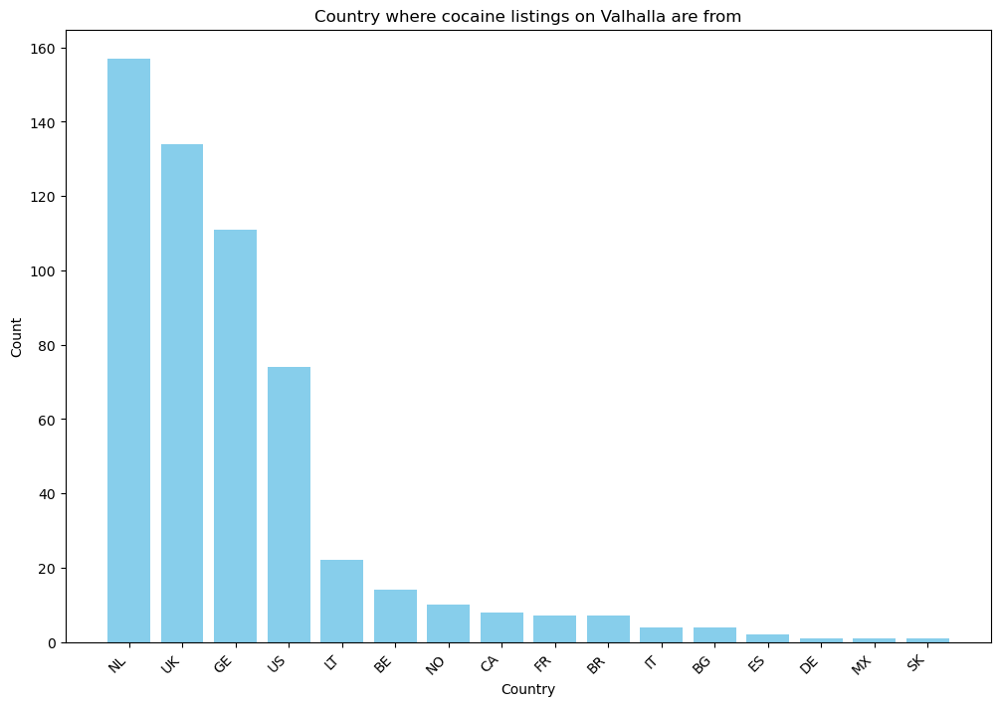

In [574]:
# data for the bar graph
labels = ['UK', 'US', 'NL', 'FR', 'DE', 'NO', 'BE', 'LT', 'CA', 'GE', 'MX', 'IT', 'ES', 'SK', 'BR', 'BG']
sizes = [uk_val_coke,us_val_coke,nl_val_coke,fr_val_coke,de_val_coke,no_val_coke,be_val_coke,lt_val_coke,
         ca_val_coke,ge_val_coke,mx_val_coke,it_val_coke,es_val_coke,sk_val_coke,br_val_coke,bg_val_coke] 

# sort by sizes in descending order
data_sorted = sorted(zip(labels, sizes), key=lambda x: x[1], reverse=True)

labels_sorted, sizes_sorted = zip(*data_sorted)

# plot
plt.figure(figsize=(12, 8))
plt.bar(labels_sorted, sizes_sorted, color='skyblue')
plt.title('Country where cocaine listings on Valhalla are from')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

plt.show()

### derive usd cost per gram

In [575]:
# get numeric values from item name
numeric_vals = []

for x in val_coke['Item']:
    x_str = str(x)
    
    numeric_val = pd.to_numeric(''.join(filter(lambda char: char.isdigit() or char == '.', x_str)), errors='coerce')
    
    if not pd.isna(numeric_val):
        numeric_vals.append(numeric_val)
    else:
        numeric_vals.append(None)

print(numeric_vals)

[0.51, 0.5, 1, 1, 1100, 2100, 1, 2, 3, 5, 7, 14, 0.5, 1, 3.5, 5, 7, 10, 14, 20, 0.388, 3.5, 14, 0.58, 180, 2, 1, 1.5, 0.5, 3, None, 0.58285, 18285, 3.58285, 28285, None, None, None, 1, 999, 999, 4, 5, 107075, 57075, 27075, 17075, 0.57075, 1090921, 590920.5, 290920.5, 19092, 0.59092, None, None, 0.3, 280, None, 1.9, None, 2.17, 3.24, 5.4, 10.7, 0.59, 190, 290, 390, 590, 1090, 1, 3.5, 5, 3.5, 2, 0.5, 1090, 90.0, 3.5, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, 10.9, None, 50.9, 500.9, 90.0, 80.0, 0.584, 2888, 3.588, 1.0, 1.0, 0.5, 1, 1.75, 3.5, 7, 10286, 10586, 1586, 2586, None, None, None, 0.5, 1, 2003, 186, 386, 586, 1086, 2586, 5086, 10086, 25086, 1, 5, 10, 25, None, 100.9, None, 1, 2, 3.58, 0.5, 0.5, 1, 2, 3.5, 7, 14, 28, 1, 2, 3.5, 7, 14, 28, 1, 2, 3.5, 7, 14, 28, 0.5, 899150, 8991500, 89911, 8991100, 17092, 3.57092, 7, 147092, 287092, 3.57092, 10186, 188, 1488, 788, 1, 0.5, 7, 0.588, None, 1, 3.

In [577]:
# divide total cost by extracted numeric values
for i, value in enumerate(numeric_vals):
    if value == 0:
        numeric_vals[i] = None

usd_cost_per_gram = []

for i, value in enumerate(val_coke['USD Price']):
    if numeric_vals[i] is not None:
        usd_per_g = value / numeric_vals[i]
        usd_cost_per_gram.append(usd_per_g)
    else:
        usd_cost_per_gram.append(None)



In [579]:
# insert usd cost per gram in new column 
val_coke.insert(5, 'USD cost per gram', usd_cost_per_gram)


In [582]:
# get stats

val_coke['outlierPrice'] = 0

# get mean and std
mean_price = val_coke['USD cost per gram'].mean()
std_price = val_coke['USD cost per gram'].std()
#mean_rating = agora_coke_copy[' Rating'].mean()
#std_rating = agora_coke_copy[' Rating'].std()

print(mean_price)
print(std_price)
#print(mean_rating)
#print(std_rating)
# iterate through the dataframe
for i,val in enumerate(val_coke['USD cost per gram']):
    if abs(val - mean_price) > 2 * std_price:
        val_coke.loc[i,'outlierPrice'] = 1

#for i,val in enumerate(agora_coke_copy[' Rating']):
#    if abs(val - mean_rating) > 2 * std_rating:
#        agora_coke_copy.loc[i,"outlierRating"] = 1
        
print(Counter(filtered_ac['outlierPrice']))
#print(Counter(agora_coke_copy['outlierRating']))

149.0430212727707
2251.3365574295963
Counter({0: 4908, 1: 80})


In [586]:
condition = val_coke['outlierPrice'] == 0
mean_price = val_coke.loc[condition, 'USD cost per gram'].mean()
test = val_coke.loc[condition, 'USD cost per gram'].sum()

#condition1 = agora_coke_copy['outlierRating'] == 0
#mean_rating = agora_coke_copy.loc[condition, ' Rating'].mean()
print(mean_price)
print(test)
#print(mean_rating)

149.0430212727707
74074.38157256703


In [690]:
max_val = val_coke['USD cost per gram'].max()
med_val = val_coke['USD cost per gram'].median()
mode_val = val_coke['USD cost per gram'].mode()
print(max_val)
print(med_val)
print(mode_val)


50117.568
44.544
0    30.598099
1    75.724800
Name: USD cost per gram, dtype: float64


Text(0, 0.5, 'Constant')

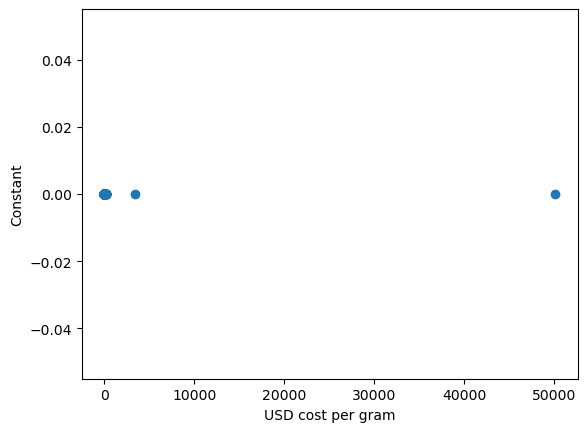

In [692]:
# visualize data
plt.scatter(val_coke['USD cost per gram'], [0] * len(val_coke['USD cost per gram']))
plt.xlabel('USD cost per gram')
plt.ylabel('Constant')


In [628]:
# set cost threshold to 1000
threshold_price = 1000  

mask = val_coke['USD cost per gram'] < threshold_price

filtered_vc =  val_coke[mask]

In [629]:
filtered_vc

,ID,Item,Vendor,Price,USD Price,USD cost per gram,Origin,outlierPrice
21,10266.0,0.5G COLOMBIAN FISHSCALE COCAINE-UK SELLER FAS...,drugkings,49.90,55.568640,108.958118,United Kingdom,0
22,10271.0,"0.5G PURE QUALITY FISHSCALE COCAINE,UK SELLER,...",drugkings,28.83,32.105088,64.210176,United Kingdom,0
187,12260.0,1g Cocaine Grade AA++,lawpee911,148.60,165.480960,165.480960,United States,0
188,12261.0,1g Cocaine Grade B,lawpee911,75.59,84.177024,84.177024,United States,0
303,13407.0,INTRO OFFER 1G COLOMBIAN FISHSCALE COCAINE 100...,drugkings,85.40,95.101440,0.086456,United Kingdom,0
...,...,...,...,...,...,...,...,...
15746,68077.0,1.75g PURE FISHSCALE COCAINE FROM UNCUTKING *F...,uncutkingg,145.62,162.162432,92.664247,United States,0
15747,68078.0,3.5g PURE FISHSCALE COCAINE FROM UNCUTKING *FA...,uncutkingg,244.88,272.698368,77.913819,United States,0
15748,68079.0,7g PURE FISHSCALE COCAINE FROM UNCUTKING *FAST...,uncutkingg,487.11,542.445696,77.492242,United States,0
15749,68080.0,14g PURE FISHSCALE COCAINE FROM UNCUTKING *FAS...,uncutkingg,837.72,932.884992,66.634642,United States,0


Text(0, 0.5, 'Constant')

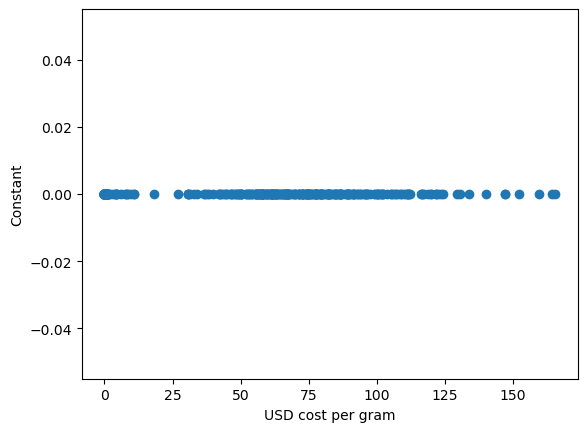

In [693]:
# visualize data
plt.scatter(filtered_vc['USD cost per gram'], [0] * len(filtered_vc['USD cost per gram']))
plt.xlabel('USD cost per gram')
plt.ylabel('Constant')


In [631]:
# get stats
mean_price = filtered_vc['USD cost per gram'].mean()
med_price = filtered_vc['USD cost per gram'].median()
mode_price = filtered_vc['USD cost per gram'].mode()

print('mean price', mean_price)
print('median price', med_price)
print('mode price', mode_price)

mean price 41.542030788956765
median price 44.37855085714285
mode price 0    30.598099
1    75.724800
Name: USD cost per gram, dtype: float64


In [711]:
# function to cluster rows in a new df by country of origin
def new_df_val(country):
    condition = filtered_vc['Origin'] == country

    # filter rows based on the condition
    new_df = filtered_vc[condition].copy()

    # reset the index of the nl_df
    new_df = new_df.reset_index(drop=True)
    
    return new_df

In [712]:
uk_coke_val_df = new_df_val(' United Kingdom')
ge_coke_val_df = new_df_val(' Germany')
us_coke_val_df = new_df_val(' United States')
nl_coke_val_df = new_df_val(' Netherlands')

In [731]:
uk_coke_val_mean = uk_coke_val_df['USD cost per gram'].mean()
ge_coke_val_mean = ge_coke_val_df['USD cost per gram'].mean()
us_coke_val_mean = us_coke_val_df['USD cost per gram'].mean()
nl_coke_val_mean = nl_coke_val_df['USD cost per gram'].mean()

print('UK avg', uk_coke_val_mean)
print('UK rows', len(uk_coke_val_df))
print('GE avg', ge_coke_val_mean)
print('GE rows', len(ge_coke_val_df))
print('US avg', us_coke_val_mean)
print('US rows', len(us_coke_val_df))
print('NL avg', nl_coke_val_mean)
print('NL rows', len(nl_coke_val_df))


UK avg 57.22970666460742
UK rows 131
GE avg 39.355972926805855
GE rows 101
US avg 52.02759764704321
US rows 62
NL avg 28.648809905568882
NL rows 149


In [713]:
uk_coke_val_df

,ID,Item,Vendor,Price,USD Price,USD cost per gram,Origin,outlierPrice
0,10266.0,0.5G COLOMBIAN FISHSCALE COCAINE-UK SELLER FAS...,drugkings,49.90,55.568640,108.958118,United Kingdom,0
1,10271.0,"0.5G PURE QUALITY FISHSCALE COCAINE,UK SELLER,...",drugkings,28.83,32.105088,64.210176,United Kingdom,0
2,13407.0,INTRO OFFER 1G COLOMBIAN FISHSCALE COCAINE 100...,drugkings,85.40,95.101440,0.086456,United Kingdom,0
3,13408.0,2G COLOMBIAN FISHSCALE COCAINE LTD OFFER 100% ...,drugkings,157.50,175.392000,0.083520,United Kingdom,0
4,13409.0,"INTRO OFFER 1G PURE QUALITY FISHSCALE COCAINE,...",drugkings,51.88,57.773568,57.773568,United Kingdom,0
...,...,...,...,...,...,...,...,...
126,67159.0,1g of Krit-A-Coca Expert Cocaine 85% - 90%,Krit-A-Coca,89.00,99.110400,0.005331,United Kingdom,0
127,67684.0,### SALE PRICE ### 3.5g Pure Flake Cocaine,platinumsteak,224.06,249.513216,71.289490,United Kingdom,0
128,68001.0,Cocaine Vape Liquid 3ML,JehovahUK,48.90,54.455040,18.151680,United Kingdom,0
129,68069.0,10/10 ★★ 3.5G ★ PURE QUALITY PERUVIAN COCAINE ...,TheHonestCocaineCompany,227.92,253.811712,0.025121,United Kingdom,0
